# Tiền xử lý dữ liệu

In [36]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Đọc dữ liệu
df = pd.read_csv("D:\\workspace\\hus\\machine-learning\\project\\data\\city_day.csv" )

# Hiển thị kích thước dữ liệu
print(f"Kích thước dữ liệu: {df.shape}")

# Xem 5 bản ghi đầu tiên
print("\n5 bản ghi đầu tiên:")
print(df.head())

# Thông tin về kiểu dữ liệu và số lượng dữ liệu không bị thiếu
print("\nThông tin về dữ liệu:")
print(df.info())

# Thống kê mô tả cho các trường số
print("\nThống kê mô tả cho các trường số:")
print(df.describe())

# Kiểm tra các giá trị bị thiếu
print("\nSố lượng giá trị bị thiếu trong mỗi trường:")
print(df.isnull().sum())

# Kiểm tra số lượng thành phố và ngày trong dữ liệu
print(f"\nSố lượng thành phố: {df['City'].nunique()}")
print(f"Các thành phố: {df['City'].unique()}")
print(f"Khoảng thời gian: từ {df['Date'].min()} đến {df['Date'].max()}")

Kích thước dữ liệu: (29531, 16)

5 bản ghi đầu tiên:
        City        Date  PM2.5  PM10     NO    NO2    NOx  NH3     CO    SO2  \
0  Ahmedabad  2015-01-01    NaN   NaN   0.92  18.22  17.15  NaN   0.92  27.64   
1  Ahmedabad  2015-01-02    NaN   NaN   0.97  15.69  16.46  NaN   0.97  24.55   
2  Ahmedabad  2015-01-03    NaN   NaN  17.40  19.30  29.70  NaN  17.40  29.07   
3  Ahmedabad  2015-01-04    NaN   NaN   1.70  18.48  17.97  NaN   1.70  18.59   
4  Ahmedabad  2015-01-05    NaN   NaN  22.10  21.42  37.76  NaN  22.10  39.33   

       O3  Benzene  Toluene  Xylene  AQI AQI_Bucket  
0  133.36     0.00     0.02    0.00  NaN        NaN  
1   34.06     3.68     5.50    3.77  NaN        NaN  
2   30.70     6.80    16.40    2.25  NaN        NaN  
3   36.08     4.43    10.14    1.00  NaN        NaN  
4   39.31     7.01    18.89    2.78  NaN        NaN  

Thông tin về dữ liệu:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29531 entries, 0 to 29530
Data columns (total 16 columns):
 #  

In [37]:
# Chuyển đổi cột Date sang định dạng datetime
df['Date'] = pd.to_datetime(df['Date'])

# Thêm các cột năm, tháng, ngày để phân tích theo thời gian
df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.month
df['Day'] = df['Date'].dt.day

# Kiểm tra các giá trị ngoại lai cho các chỉ số ô nhiễm
numeric_cols = ['PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2', 'O3', 'Benzene', 'Toluene', 'Xylene', 'AQI']

# Xử lý giá trị thiếu
# Phương pháp 1: Điền giá trị thiếu bằng giá trị trung bình theo thành phố
for col in numeric_cols:
    city_means = df.groupby('City')[col].transform('mean')
    df[col].fillna(city_means, inplace=True)
    
# Nếu vẫn còn giá trị NA (có thể xảy ra nếu một thành phố không có dữ liệu nào cho một chỉ số cụ thể)
# thì điền bằng giá trị trung bình của tất cả các thành phố
for col in numeric_cols:
    df[col].fillna(df[col].mean(), inplace=True)

# Xử lý AQI_Bucket
# Điền các giá trị thiếu bằng cách ánh xạ từ giá trị AQI
def map_aqi_to_bucket(aqi):
    if pd.isna(aqi):
        return None
    elif aqi <= 50:
        return 'Good'
    elif aqi <= 100:
        return 'Satisfactory'
    elif aqi <= 200:
        return 'Moderate'
    elif aqi <= 300:
        return 'Poor'
    elif aqi <= 400:
        return 'Very Poor'
    else:
        return 'Severe'

# Điền giá trị thiếu cho AQI_Bucket
df['AQI_Bucket'] = df.apply(lambda row: row['AQI_Bucket'] if pd.notna(row['AQI_Bucket']) else map_aqi_to_bucket(row['AQI']), axis=1)

# Kiểm tra lại các giá trị thiếu sau khi xử lý
print("\nSố lượng giá trị bị thiếu sau khi xử lý:")
print(df.isnull().sum())

C:\Users\doquo\AppData\Local\Temp\ipykernel_3664\999035102.py:16: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(city_means, inplace=True)
C:\Users\doquo\AppData\Local\Temp\ipykernel_3664\999035102.py:16: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when


Số lượng giá trị bị thiếu sau khi xử lý:
City          0
Date          0
PM2.5         0
PM10          0
NO            0
NO2           0
NOx           0
NH3           0
CO            0
SO2           0
O3            0
Benzene       0
Toluene       0
Xylene        0
AQI           0
AQI_Bucket    0
Year          0
Month         0
Day           0
dtype: int64


In [38]:
# Phát hiện và xử lý các giá trị ngoại lai
for col in numeric_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # Thay thế các giá trị ngoại lai bằng giới hạn trên/dưới
    df[col] = df[col].clip(lower=lower_bound, upper=upper_bound)

In [39]:
# Chuyển đổi cột AQI_Bucket sang one-hot encoding
aqi_bucket_dummies = pd.get_dummies(df['AQI_Bucket'], prefix='AQI_Bucket')
df = pd.concat([df, aqi_bucket_dummies], axis=1)

# Chuyển đổi cột City sang one-hot encoding
city_dummies = pd.get_dummies(df['City'], prefix='City')
df = pd.concat([df, city_dummies], axis=1)

In [40]:
# Chuẩn hóa các biến số về thang đo từ 0-1
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
df_normalized = df.copy()

for col in numeric_cols:
    df_normalized[col] = scaler.fit_transform(df[col].values.reshape(-1, 1))

# Kiểm tra kết quả chuẩn hóa
print("\nThống kê mô tả sau khi chuẩn hóa:")
print(df_normalized[numeric_cols].describe())


Thống kê mô tả sau khi chuẩn hóa:
              PM2.5          PM10            NO           NO2           NOx  \
count  29531.000000  29531.000000  29531.000000  29531.000000  29531.000000   
mean       0.417653      0.482570      0.337301      0.365861      0.375235   
std        0.266437      0.239369      0.279034      0.255096      0.265757   
min        0.000000      0.000000      0.000000      0.000000      0.000000   
25%        0.222187      0.280006      0.128746      0.164999      0.179692   
50%        0.349598      0.476491      0.232444      0.309857      0.324062   
75%        0.533312      0.568003      0.477248      0.499000      0.507815   
max        1.000000      1.000000      1.000000      1.000000      1.000000   

                NH3            CO           SO2            O3       Benzene  \
count  29531.000000  29531.000000  29531.000000  29531.000000  29531.000000   
mean       0.409473      0.375335      0.414446      0.433168      0.280646   
std        0.260

# PCA

Số lượng thành phần chính được giữ lại: 10
Tỉ lệ phương sai giải thích: [0.35626701 0.12364254 0.09678497 0.0841864  0.07639038 0.06595927
 0.04814597 0.04238884 0.03168371 0.02458137]
Tổng tỉ lệ phương sai giải thích: 0.9500304640925653

Tỉ lệ phương sai giải thích: [0.35626701 0.12364254 0.09678497 0.0841864  0.07639038 0.06595927
 0.04814597 0.04238884 0.03168371 0.02458137]
Tổng tỉ lệ phương sai giải thích: 0.9500304640925653


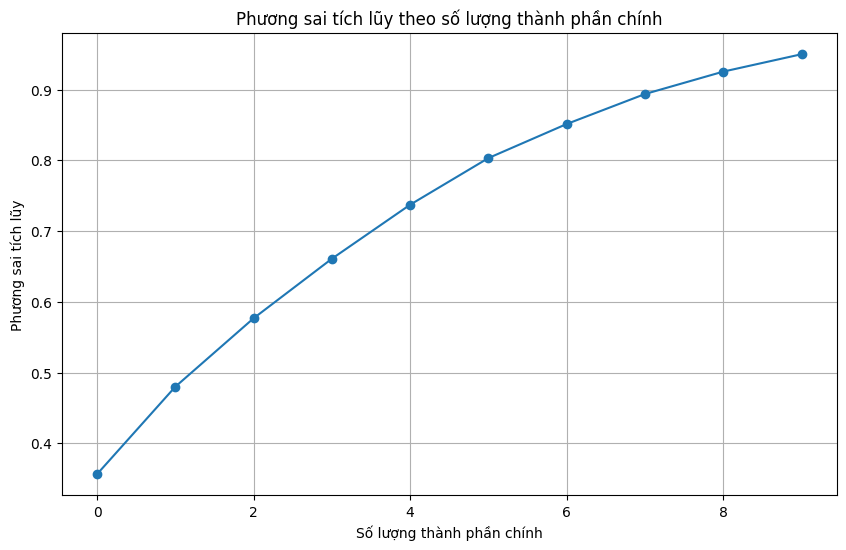

Kích thước dữ liệu ban đầu: (29531, 13)
Kích thước dữ liệu sau khi giảm chiều: (29531, 10)


In [41]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Chọn các cột số để thực hiện PCA
numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns
X = df[numeric_columns]

# Chuẩn hóa dữ liệu
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Khởi tạo PCA với tham số n_components=0.95 để giữ 95% thông tin
pca = PCA(n_components=0.95)

# Áp dụng PCA
X_pca = pca.fit_transform(X_scaled)

# Hiển thị số lượng thành phần được giữ lại
print(f"Số lượng thành phần chính được giữ lại: {pca.n_components_}")
print(f"Tỉ lệ phương sai giải thích: {pca.explained_variance_ratio_}")
print(f"Tổng tỉ lệ phương sai giải thích: {sum(pca.explained_variance_ratio_)}")

# Visualize số lượng thành phần chính và phương sai tích lũy
plt.figure(figsize=(10, 6))
plt.plot(np.cumsum(pca.explained_variance_ratio_), marker='o')
plt.xlabel('Số lượng thành phần chính')
plt.ylabel('Phương sai tích lũy')
plt.title('Phương sai tích lũy theo số lượng thành phần chính')
plt.grid(True)
plt.show()

# Hiển thị kích thước của dữ liệu sau khi giảm chiều
print(f"Kích thước dữ liệu ban đầu: {X_scaled.shape}")
print(f"Kích thước dữ liệu sau khi giảm chiều: {X_pca.shape}")

# Phân tích chi tiết PCA và so sánh với t-SNE

## 1. Phân tích thống kê mô tả của dữ liệu

Thống kê mô tả cho dữ liệu gốc:


,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI
count,29531.000000,29531.000000,29531.000000,29531.000000,29531.000000,29531.000000,29531.000000,29531.000000,29531.000000,29531.000000,29531.000000,29531.000000,29531.000000
mean,59.796686,109.904446,15.975179,27.438577,30.487856,20.974452,1.131634,12.753181,33.629237,2.197187,6.122462,2.683577,161.156056
std,38.121104,54.510896,13.199008,19.124515,21.592776,13.324066,0.868505,8.781758,18.033607,2.240971,6.293483,1.758886,105.204065
min,0.040000,0.010000,0.020000,0.010000,0.000000,0.010000,0.000000,0.010000,0.010000,0.000000,0.000000,0.000000,13.000000
25%,31.830000,63.775000,6.110000,12.380000,14.600000,10.977550,0.540000,6.070000,19.960000,0.220000,0.690000,1.170000,87.000000
50%,50.059571,108.520000,11.015184,23.240000,26.330000,18.371518,0.910000,9.949676,32.868086,1.620000,4.340000,3.114350,119.000000
75%,76.345000,129.360000,22.595000,37.420000,41.260000,27.070000,1.530000,15.945000,43.025000,3.263615,8.276830,3.114350,215.000000
max,143.117500,227.737500,47.322500,74.980000,81.250000,51.208675,3.015000,30.757500,77.622500,7.829038,19.657074,6.030874,407.000000


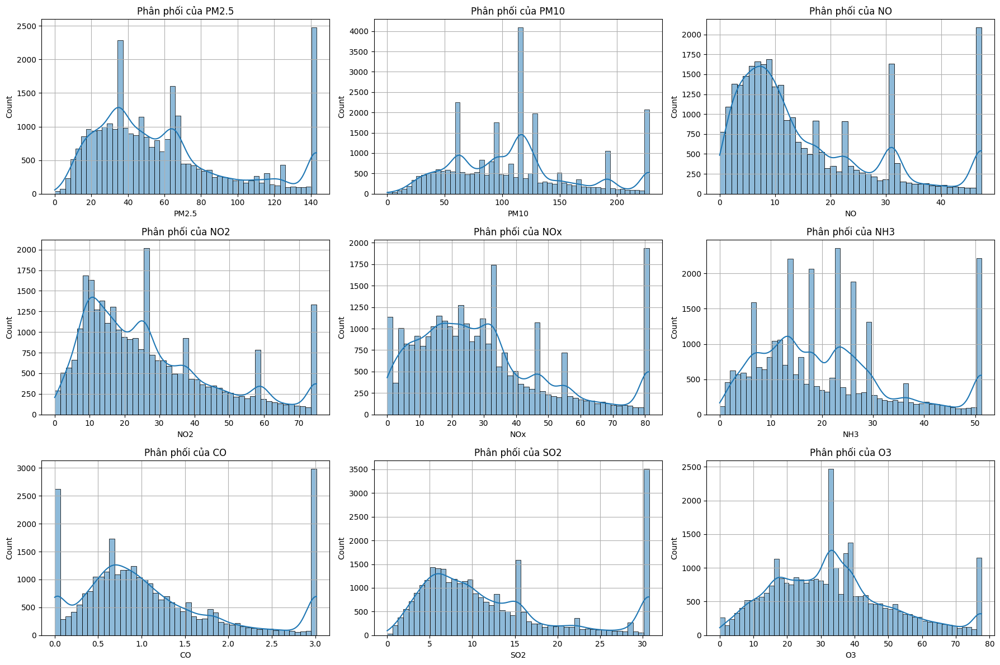

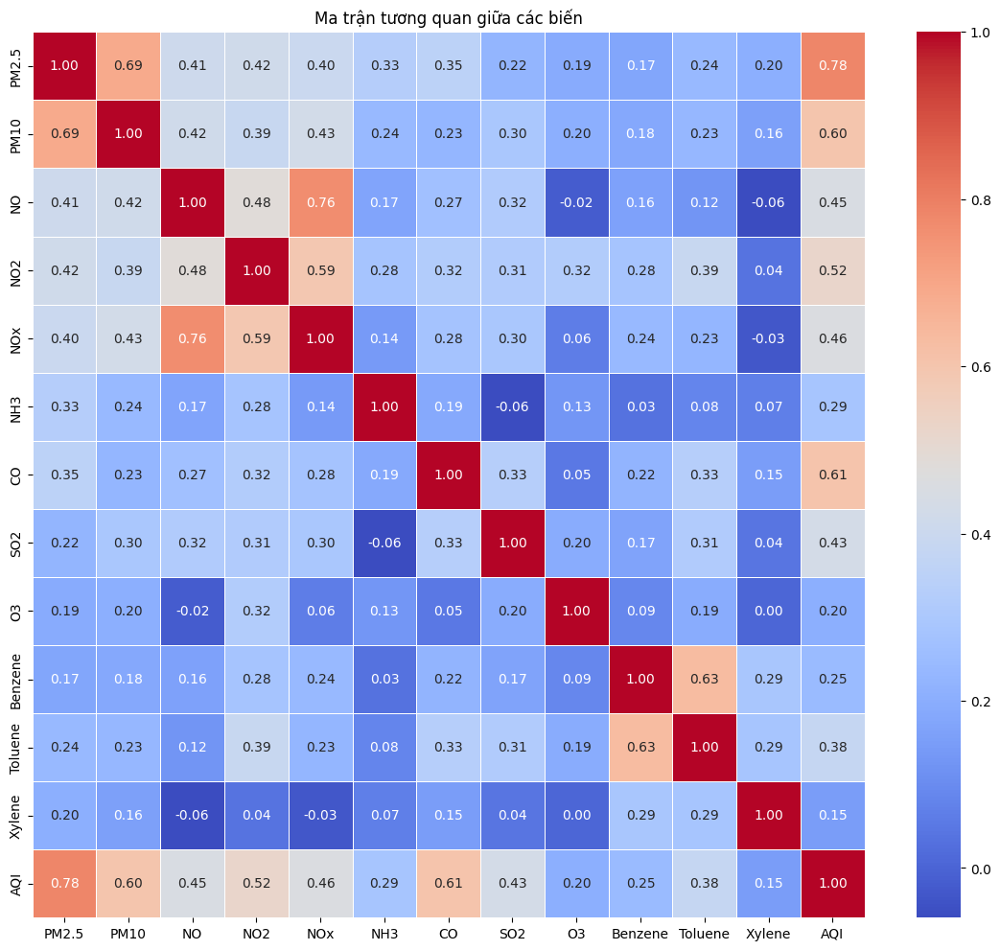


Top 5 cặp biến có tương quan cao nhất:
PM2.5 - AQI: 0.7827
NO - NOx: 0.7649
PM2.5 - PM10: 0.6879
Benzene - Toluene: 0.6337
CO - AQI: 0.6058


In [42]:
# 1.1. Phân tích thống kê mô tả cho từng trường dữ liệu
numeric_features = ['PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2', 'O3', 'Benzene', 'Toluene', 'Xylene', 'AQI']

# Hiển thị thống kê cho dữ liệu gốc
print("Thống kê mô tả cho dữ liệu gốc:")
stats_original = df[numeric_features].describe()
display(stats_original)

# Biểu đồ phân phối cho các trường chính
plt.figure(figsize=(18, 12))
for i, column in enumerate(numeric_features[:9], 1):
    plt.subplot(3, 3, i)
    sns.histplot(df[column].dropna(), kde=True)
    plt.title(f'Phân phối của {column}')
    plt.grid(True)
plt.tight_layout()
plt.show()

# Ma trận tương quan giữa các biến
plt.figure(figsize=(14, 12))
correlation_matrix = df[numeric_features].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Ma trận tương quan giữa các biến')
plt.show()

# Hiển thị top 5 cặp biến có tương quan cao nhất
corr_pairs = []
for i in range(len(numeric_features)):
    for j in range(i+1, len(numeric_features)):
        corr_pairs.append((numeric_features[i], numeric_features[j], correlation_matrix.iloc[i, j]))

corr_pairs.sort(key=lambda x: abs(x[2]), reverse=True)
print("\nTop 5 cặp biến có tương quan cao nhất:")
for var1, var2, corr in corr_pairs[:5]:
    print(f"{var1} - {var2}: {corr:.4f}")

## 2. Chuẩn hóa dữ liệu và phân tích thành phần chính


Thống kê mô tả cho dữ liệu đã chuẩn hóa:


,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene
count,2.953100e+04,2.953100e+04,2.953100e+04,2.953100e+04,2.953100e+04,2.953100e+04,2.953100e+04,2.953100e+04,2.953100e+04,2.953100e+04,2.953100e+04,2.953100e+04
mean,-2.579330e-16,-3.965238e-16,-1.616893e-16,9.624364e-17,1.462903e-16,-2.155858e-16,1.077929e-16,2.001868e-16,-1.347411e-16,1.539898e-16,-1.847878e-16,-2.155858e-16
std,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00,1.000017e+00
min,-1.567575e+00,-2.016043e+00,-1.208837e+00,-1.434235e+00,-1.411971e+00,-1.573454e+00,-1.302990e+00,-1.451121e+00,-1.864286e+00,-9.804786e-01,-9.728422e-01,-1.525752e+00
25%,-7.336398e-01,-8.462570e-01,-7.474308e-01,-7.874099e-01,-7.358074e-01,-7.503018e-01,-6.812217e-01,-7.610429e-01,-7.579997e-01,-8.823052e-01,-8.632031e-01,-8.605464e-01
50%,-2.554302e-01,-2.539803e-02,-3.757918e-01,-2.195427e-01,-1.925610e-01,-1.953591e-01,-2.551950e-01,-3.192473e-01,-4.220811e-02,-2.575654e-01,-2.832282e-01,2.449164e-01
75%,4.341058e-01,3.569173e-01,5.015478e-01,5.219266e-01,4.988857e-01,4.574919e-01,4.586875e-01,3.634663e-01,5.210229e-01,4.758858e-01,3.423231e-01,2.449164e-01
max,2.185724e+00,2.161679e+00,2.375016e+00,2.485931e+00,2.350925e+00,2.269182e+00,2.168551e+00,2.050230e+00,2.439557e+00,2.513172e+00,2.150612e+00,1.903111e+00



Phương sai giải thích của từng thành phần:
PC1: 0.3294 (0.3294 tích lũy)
PC2: 0.1338 (0.4632 tích lũy)
PC3: 0.1026 (0.5658 tích lũy)
PC4: 0.0910 (0.6568 tích lũy)
PC5: 0.0768 (0.7336 tích lũy)
PC6: 0.0703 (0.8039 tích lũy)
PC7: 0.0504 (0.8543 tích lũy)
PC8: 0.0451 (0.8994 tích lũy)
PC9: 0.0340 (0.9334 tích lũy)
PC10: 0.0254 (0.9588 tích lũy)
PC11: 0.0239 (0.9827 tích lũy)
PC12: 0.0173 (1.0000 tích lũy)


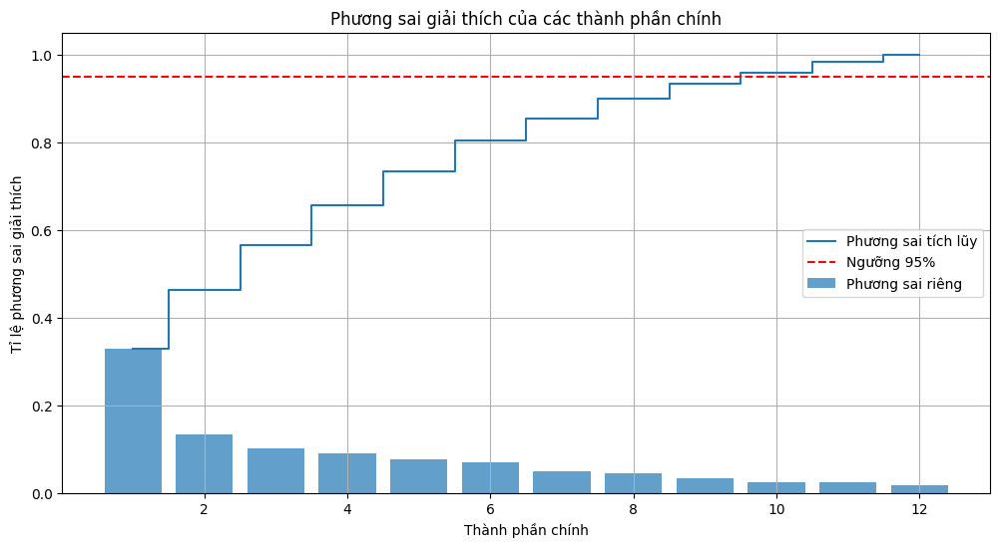


Số lượng thành phần cần thiết để giữ 95% phương sai: 10


In [43]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Chuẩn bị dữ liệu cho PCA
X = df[numeric_features].copy()
# Loại bỏ biến mục tiêu AQI để tránh rò rỉ thông tin
X_features = X.drop('AQI', axis=1)

# Chuẩn hóa dữ liệu
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_features)
X_scaled_df = pd.DataFrame(X_scaled, columns=X_features.columns)

# Thống kê cho dữ liệu đã chuẩn hóa
print("\nThống kê mô tả cho dữ liệu đã chuẩn hóa:")
display(X_scaled_df.describe())

# Thực hiện PCA với n_components=12 (số lượng tối đa)
pca_full = PCA()
X_pca_full = pca_full.fit_transform(X_scaled)

# Hiển thị phương sai giải thích cho mỗi thành phần
explained_variance = pca_full.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance)

print("\nPhương sai giải thích của từng thành phần:")
for i, var in enumerate(explained_variance):
    print(f"PC{i+1}: {var:.4f} ({cumulative_variance[i]:.4f} tích lũy)")

# Vẽ biểu đồ phương sai giải thích
plt.figure(figsize=(12, 6))
plt.bar(range(1, len(explained_variance)+1), explained_variance, alpha=0.7, label='Phương sai riêng')
plt.step(range(1, len(explained_variance)+1), cumulative_variance, where='mid', label='Phương sai tích lũy')
plt.axhline(y=0.95, color='r', linestyle='--', label='Ngưỡng 95%')
plt.xlabel('Thành phần chính')
plt.ylabel('Tỉ lệ phương sai giải thích')
plt.title('Phương sai giải thích của các thành phần chính')
plt.legend()
plt.grid(True)
plt.show()

# Xác định số lượng thành phần tối ưu để đạt 95% phương sai
n_components_95 = np.argmax(cumulative_variance >= 0.95) + 1
print(f"\nSố lượng thành phần cần thiết để giữ 95% phương sai: {n_components_95}")

## 3. Phân tích các thành phần chính

Trọng số của các biến trong các thành phần chính:


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
PM2.5,0.359990,-0.105482,0.359288,-0.132004,0.263589,-0.140966,-0.276603,-0.186016,0.087759,-0.073351
PM10,0.351774,-0.126572,0.265269,-0.055568,0.311277,-0.351673,-0.350764,0.052097,0.061737,0.004710
NO,0.342685,-0.370779,-0.262837,-0.198698,-0.096500,-0.090912,0.172024,0.051344,-0.346552,0.201552
NO2,0.380042,-0.081952,-0.030306,0.213383,-0.300630,0.035197,0.276189,-0.111714,0.652799,-0.398861
NOx,0.368665,-0.294279,-0.279522,-0.112782,-0.202237,-0.142353,0.211243,-0.110734,-0.109655,0.186642
NH3,0.174834,-0.121709,0.578706,-0.088716,-0.392486,0.409389,0.018746,0.508063,-0.151474,0.021735
CO,0.275482,0.113893,-0.051182,-0.126373,0.249906,0.735595,-0.032092,-0.481305,-0.136073,-0.025871
SO2,0.259515,0.049887,-0.339157,0.303561,0.514361,0.171904,0.078090,0.609433,-0.024698,-0.166561
O3,0.149609,0.094456,0.276008,0.780663,-0.030778,-0.128957,0.196671,-0.249818,-0.387730,0.115376
Benzene,0.242128,0.484662,-0.195908,-0.114513,-0.345825,-0.169143,-0.288609,0.020105,-0.389901,-0.520400


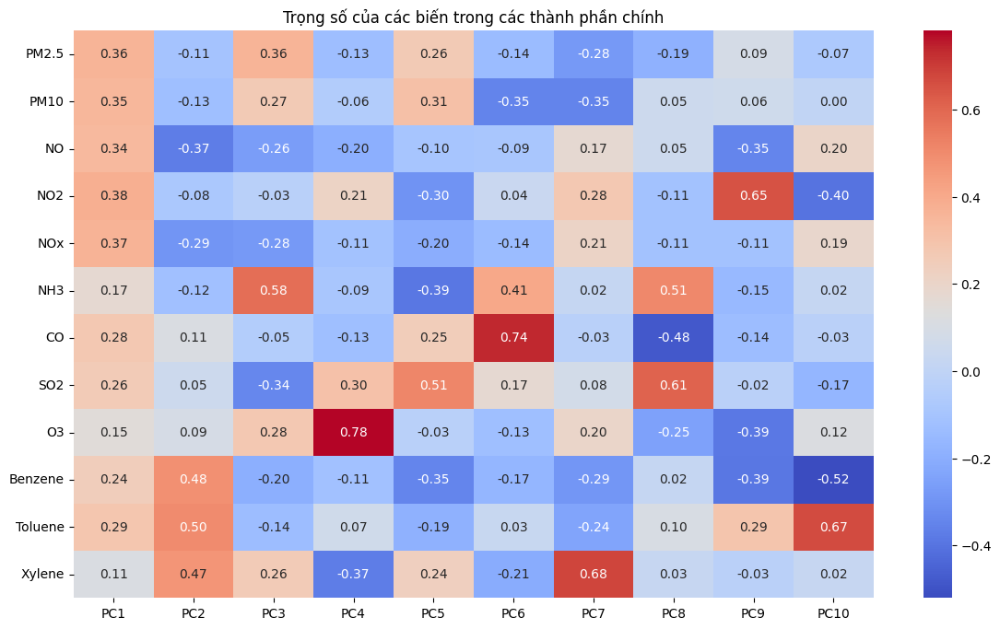

In [44]:
# Phân tích trọng số của các biến trong thành phần chính
loadings = pca_full.components_
loading_df = pd.DataFrame(loadings.T, columns=[f'PC{i+1}' for i in range(loadings.shape[0])], index=X_features.columns)

print("Trọng số của các biến trong các thành phần chính:")
display(loading_df.iloc[:, :n_components_95])

# Biểu diễn heatmap của trọng số
plt.figure(figsize=(14, 8))
sns.heatmap(loading_df.iloc[:, :n_components_95], cmap='coolwarm', annot=True, fmt='.2f')
plt.title('Trọng số của các biến trong các thành phần chính')
plt.show()

# Tạo DataFrame với dữ liệu PCA
X_pca_df = pd.DataFrame(
    X_pca_full[:, :n_components_95], 
    columns=[f'PC{i+1}' for i in range(n_components_95)]
)
X_pca_df['AQI'] = df['AQI']

# Thêm cột AQI_Bucket để phân loại màu trong biểu đồ
X_pca_df['AQI_Bucket'] = df['AQI_Bucket']

## 4. Trực quan hóa các cặp thành phần chính (2D)

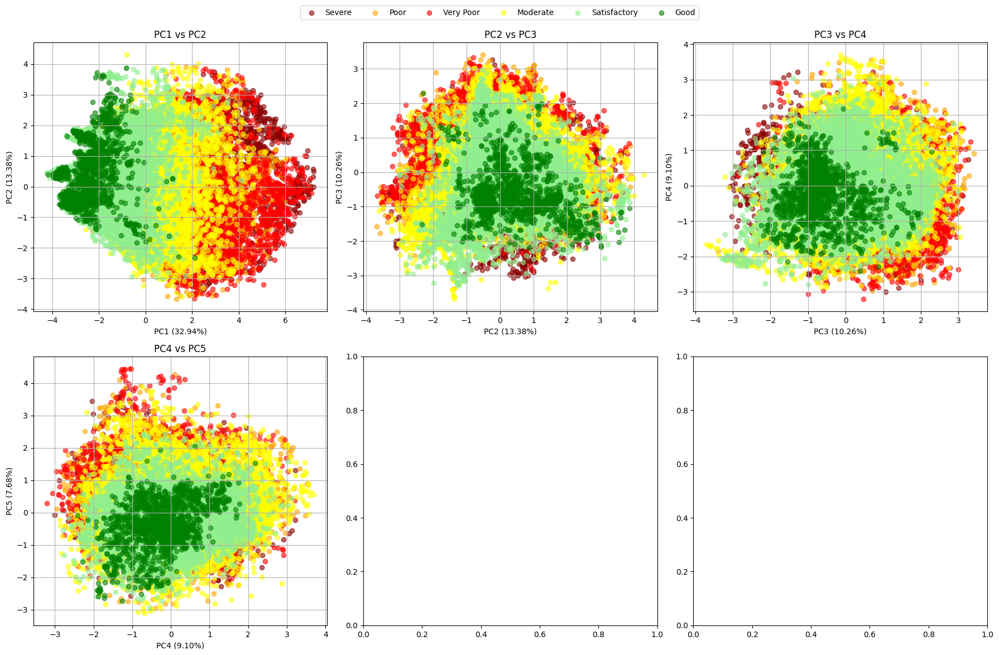

In [45]:
# Trực quan hóa các cặp thành phần chính
# Tạo color palette cho các mức AQI_Bucket
color_mapping = {
    'Good': 'green',
    'Satisfactory': 'lightgreen',
    'Moderate': 'yellow',
    'Poor': 'orange',
    'Very Poor': 'red',
    'Severe': 'darkred'
}

# Vẽ scatter plot cho các cặp thành phần chính
num_pairs = min(6, (n_components_95 * (n_components_95 - 1)) // 2)  # Tối đa 6 cặp
pairs = []
for i in range(min(4, n_components_95)):
    for j in range(i+1, min(i+2, n_components_95)):
        pairs.append((i, j))
        if len(pairs) >= num_pairs:
            break
    if len(pairs) >= num_pairs:
        break

fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

for i, (pc_i, pc_j) in enumerate(pairs):
    if i < len(axes):
        ax = axes[i]
        for category in X_pca_df['AQI_Bucket'].unique():
            subset = X_pca_df[X_pca_df['AQI_Bucket'] == category]
            ax.scatter(
                subset[f'PC{pc_i+1}'], 
                subset[f'PC{pc_j+1}'],
                alpha=0.6,
                color=color_mapping.get(category, 'blue'),
                label=category
            )
        ax.set_xlabel(f'PC{pc_i+1} ({explained_variance[pc_i]:.2%})')
        ax.set_ylabel(f'PC{pc_j+1} ({explained_variance[pc_j]:.2%})')
        ax.set_title(f'PC{pc_i+1} vs PC{pc_j+1}')
        ax.grid(True)

# Thêm legend chung cho toàn bộ biểu đồ
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.5, 0.98), ncol=6)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

## 5. Trực quan hóa trong không gian 3D

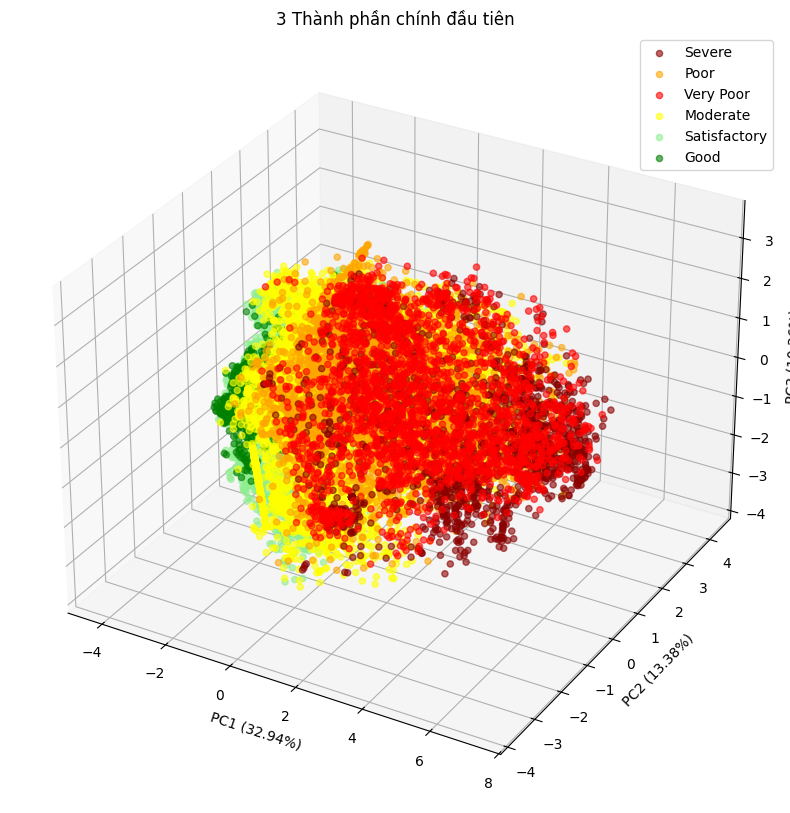

In [46]:
from mpl_toolkits.mplot3d import Axes3D

# Trực quan hóa 3 thành phần chính đầu tiên trong không gian 3D
if n_components_95 >= 3:
    fig = plt.figure(figsize=(12, 10))
    ax = fig.add_subplot(111, projection='3d')
    
    # Vẽ scatter plot 3D
    for category in X_pca_df['AQI_Bucket'].unique():
        subset = X_pca_df[X_pca_df['AQI_Bucket'] == category]
        ax.scatter(
            subset['PC1'], 
            subset['PC2'],
            subset['PC3'],
            alpha=0.6,
            color=color_mapping.get(category, 'blue'),
            label=category
        )
    
    ax.set_xlabel(f'PC1 ({explained_variance[0]:.2%})')
    ax.set_ylabel(f'PC2 ({explained_variance[1]:.2%})')
    ax.set_zlabel(f'PC3 ({explained_variance[2]:.2%})')
    ax.set_title('3 Thành phần chính đầu tiên')
    plt.legend()
    plt.show()

## 6. Phân tích mối quan hệ tuyến tính giữa các thành phần chính và AQI

Hệ số tương quan giữa các thành phần chính và AQI:
PC1     0.785788
PC5     0.241625
PC6     0.152827
PC3     0.142903
PC9     0.054674
PC10   -0.022407
PC4    -0.035448
PC2    -0.039934
PC8    -0.116121
PC7    -0.140868
Name: AQI, dtype: float64


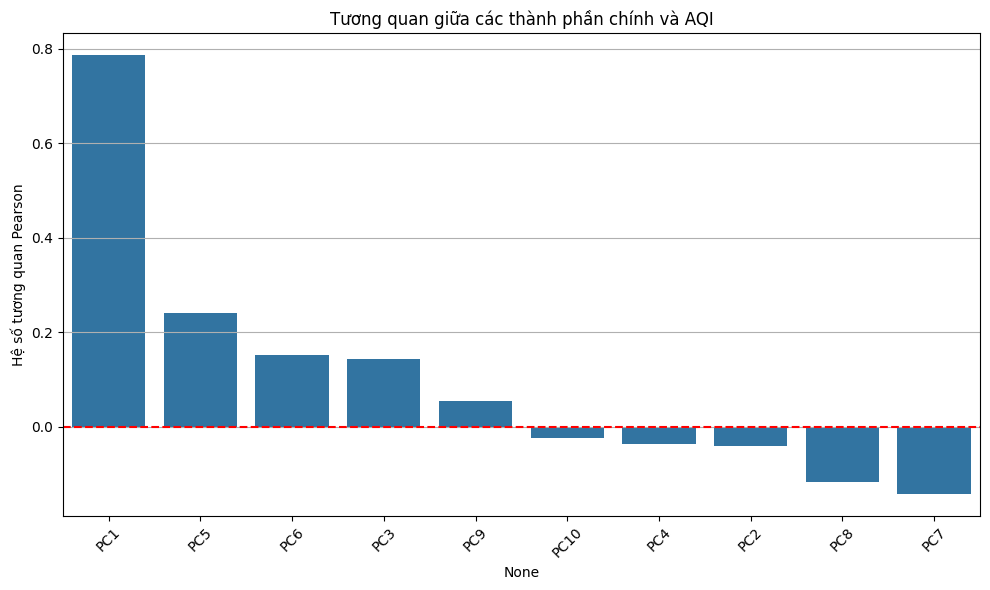

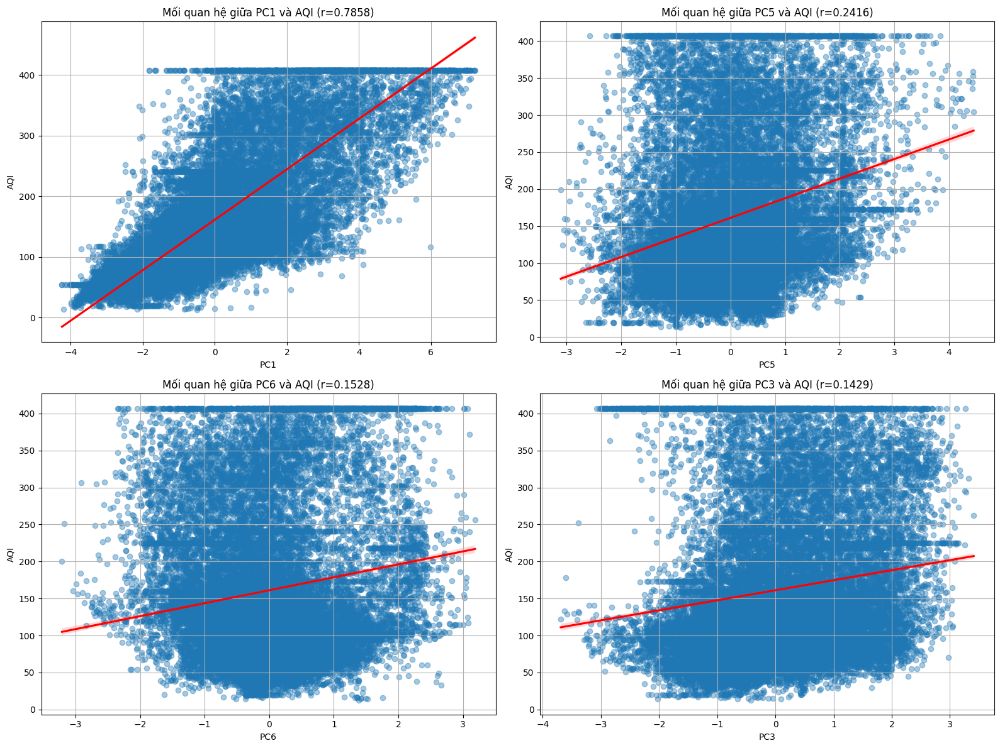

In [47]:
# Phân tích tương quan giữa các thành phần chính và biến mục tiêu AQI
pc_corr = X_pca_df.drop('AQI_Bucket', axis=1).corr()['AQI'].drop('AQI')
pc_corr = pc_corr.sort_values(ascending=False)

print("Hệ số tương quan giữa các thành phần chính và AQI:")
print(pc_corr)

# Biểu đồ tương quan
plt.figure(figsize=(10, 6))
sns.barplot(x=pc_corr.index, y=pc_corr.values)
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Tương quan giữa các thành phần chính và AQI')
plt.xticks(rotation=45)
plt.ylabel('Hệ số tương quan Pearson')
plt.grid(True, axis='y')
plt.tight_layout()
plt.show()

# Vẽ biểu đồ scatter với đường hồi quy cho 4 thành phần chính có tương quan cao nhất
top_components = pc_corr.abs().sort_values(ascending=False).index[:4]

fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.flatten()

for i, component in enumerate(top_components):
    ax = axes[i]
    sns.regplot(
        x=component, 
        y='AQI', 
        data=X_pca_df, 
        scatter_kws={'alpha':0.4}, 
        line_kws={'color':'red'},
        ax=ax
    )
    ax.set_title(f'Mối quan hệ giữa {component} và AQI (r={pc_corr[component]:.4f})')
    ax.grid(True)

plt.tight_layout()
plt.show()

# Phân tích và trực quan hóa dữ liệu sử dụng t-SNE

t-SNE (t-distributed Stochastic Neighbor Embedding) là một thuật toán giảm chiều dữ liệu phi tuyến tính, thường được sử dụng để trực quan hóa dữ liệu nhiều chiều. Không giống như PCA tập trung vào việc bảo toàn phương sai toàn cục, t-SNE cố gắng bảo toàn cấu trúc cục bộ của dữ liệu, giúp phát hiện các cụm và mối quan hệ phức tạp hơn.

In [48]:
from sklearn.manifold import TSNE
import time
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Chuẩn bị dữ liệu cho t-SNE
# Lấy dữ liệu đã được chuẩn hóa bằng StandardScaler từ phần PCA trước đó
X_scaled_tsne = X_scaled.copy()

# Đo thời gian thực thi t-SNE
start_time = time.time()

# Khởi tạo và thực hiện t-SNE với 2 thành phần chính để trực quan hóa
tsne_2d = TSNE(n_components=2, perplexity=30, n_iter=1000, random_state=42, learning_rate=200)
X_tsne_2d = tsne_2d.fit_transform(X_scaled_tsne)

print(f"Thời gian thực hiện t-SNE 2D: {time.time() - start_time:.2f} giây")

# Khởi tạo và thực hiện t-SNE với 3 thành phần chính cho trực quan hóa 3D
start_time = time.time()
tsne_3d = TSNE(n_components=3, perplexity=30, n_iter=1000, random_state=42, learning_rate=200)
X_tsne_3d = tsne_3d.fit_transform(X_scaled_tsne)

print(f"Thời gian thực hiện t-SNE 3D: {time.time() - start_time:.2f} giây")

# Hiển thị kích thước của dữ liệu giảm chiều bằng t-SNE
print(f"Kích thước dữ liệu t-SNE 2D: {X_tsne_2d.shape}")
print(f"Kích thước dữ liệu t-SNE 3D: {X_tsne_3d.shape}")

c:\Users\doquo\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\manifold\_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


Thời gian thực hiện t-SNE 2D: 101.73 giây


c:\Users\doquo\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\manifold\_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


Thời gian thực hiện t-SNE 3D: 206.56 giây
Kích thước dữ liệu t-SNE 2D: (29531, 2)
Kích thước dữ liệu t-SNE 3D: (29531, 3)


## 1. Trực quan hóa kết quả t-SNE 2D

Sau khi thực hiện giảm chiều với t-SNE, chúng ta sẽ trực quan hóa dữ liệu trong không gian 2 chiều, phân loại theo các mức độ chất lượng không khí (AQI_Bucket).

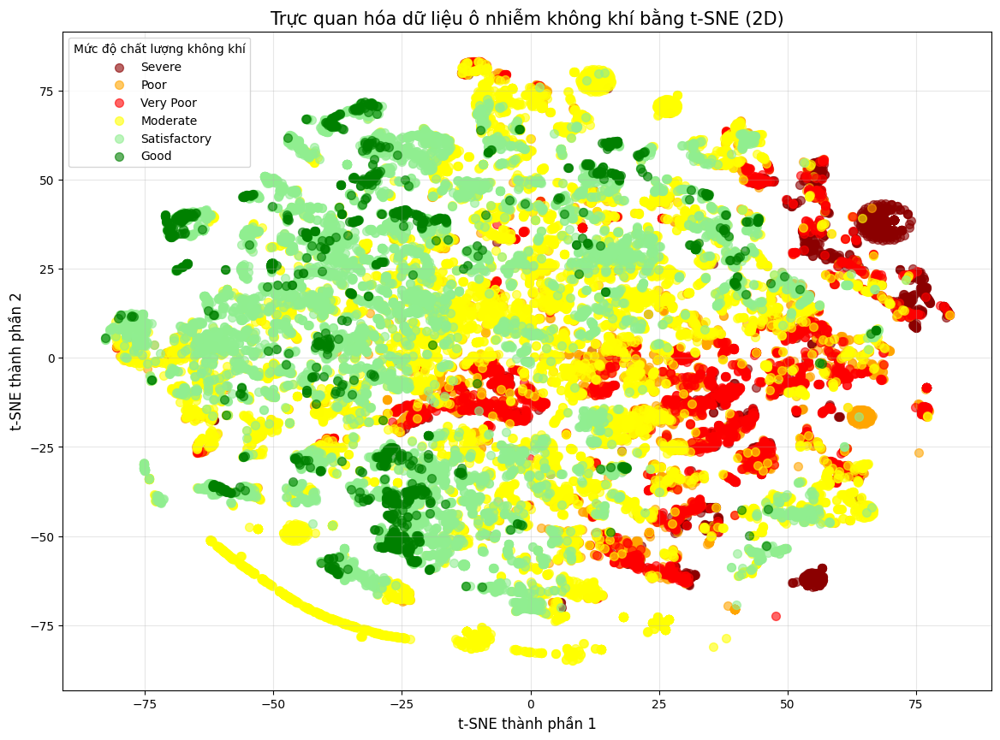

In [49]:
# Tạo DataFrame để trực quan hóa kết quả t-SNE 2D
tsne_2d_df = pd.DataFrame({
    'TSNE1': X_tsne_2d[:, 0],
    'TSNE2': X_tsne_2d[:, 1],
    'AQI_Bucket': df['AQI_Bucket'].values,
    'AQI': df['AQI'].values
})

# Tạo color palette cho các mức AQI_Bucket
color_mapping = {
    'Good': 'green',
    'Satisfactory': 'lightgreen',
    'Moderate': 'yellow',
    'Poor': 'orange',
    'Very Poor': 'red',
    'Severe': 'darkred'
}

# Vẽ biểu đồ phân tán 2D của kết quả t-SNE với màu sắc theo AQI_Bucket
plt.figure(figsize=(14, 10))
for category in tsne_2d_df['AQI_Bucket'].unique():
    subset = tsne_2d_df[tsne_2d_df['AQI_Bucket'] == category]
    plt.scatter(
        subset['TSNE1'], 
        subset['TSNE2'],
        alpha=0.6,
        s=50,  # Kích thước điểm
        color=color_mapping.get(category, 'blue'),
        label=category
    )

plt.title('Trực quan hóa dữ liệu ô nhiễm không khí bằng t-SNE (2D)', fontsize=15)
plt.xlabel('t-SNE thành phần 1', fontsize=12)
plt.ylabel('t-SNE thành phần 2', fontsize=12)
plt.legend(title='Mức độ chất lượng không khí', fontsize=10)
plt.grid(True, alpha=0.3)
plt.show()

## 2. Trực quan hóa kết quả t-SNE 3D

Để có cái nhìn tổng thể hơn về phân bố dữ liệu, chúng ta sẽ trực quan hóa kết quả t-SNE trong không gian 3 chiều.

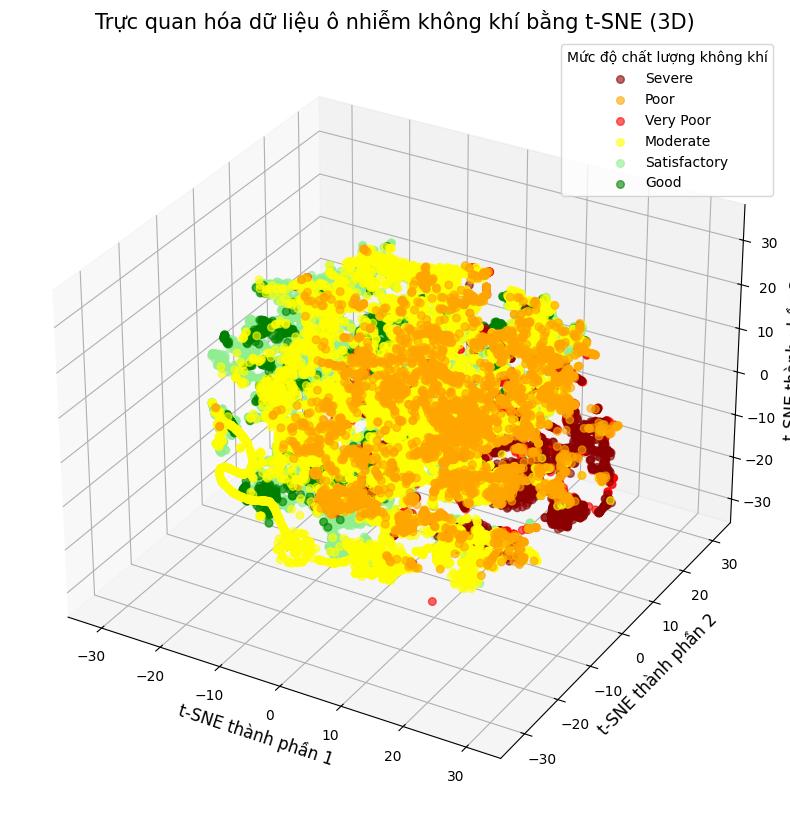

In [50]:
# Tạo DataFrame để trực quan hóa kết quả t-SNE 3D
tsne_3d_df = pd.DataFrame({
    'TSNE1': X_tsne_3d[:, 0],
    'TSNE2': X_tsne_3d[:, 1],
    'TSNE3': X_tsne_3d[:, 2],
    'AQI_Bucket': df['AQI_Bucket'].values,
    'AQI': df['AQI'].values
})

# Trực quan hóa kết quả t-SNE 3D
fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection='3d')

# Vẽ biểu đồ phân tán 3D với màu sắc theo AQI_Bucket
for category in tsne_3d_df['AQI_Bucket'].unique():
    subset = tsne_3d_df[tsne_3d_df['AQI_Bucket'] == category]
    ax.scatter(
        subset['TSNE1'], 
        subset['TSNE2'],
        subset['TSNE3'],
        alpha=0.6,
        s=30,  # Kích thước điểm
        color=color_mapping.get(category, 'blue'),
        label=category
    )

ax.set_title('Trực quan hóa dữ liệu ô nhiễm không khí bằng t-SNE (3D)', fontsize=15)
ax.set_xlabel('t-SNE thành phần 1', fontsize=12)
ax.set_ylabel('t-SNE thành phần 2', fontsize=12)
ax.set_zlabel('t-SNE thành phần 3', fontsize=12)
plt.legend(title='Mức độ chất lượng không khí')
plt.show()

## 3. Phân tích cấu trúc cụm và mật độ dữ liệu trong t-SNE

Một trong những ưu điểm của t-SNE là khả năng bảo toàn cấu trúc cục bộ của dữ liệu, giúp phát hiện các cụm dữ liệu tự nhiên. Chúng ta sẽ phân tích cụm và mật độ trong không gian t-SNE.

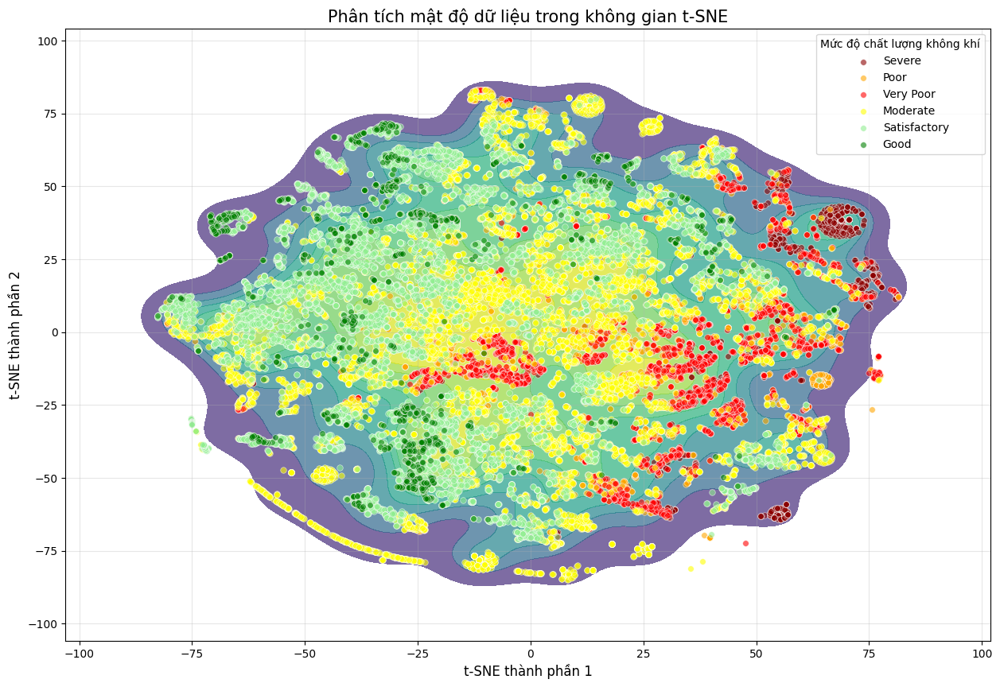

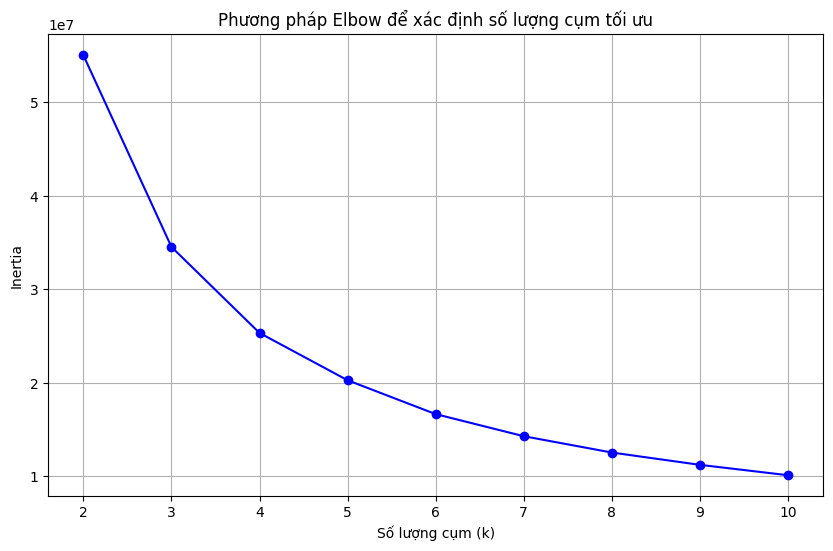

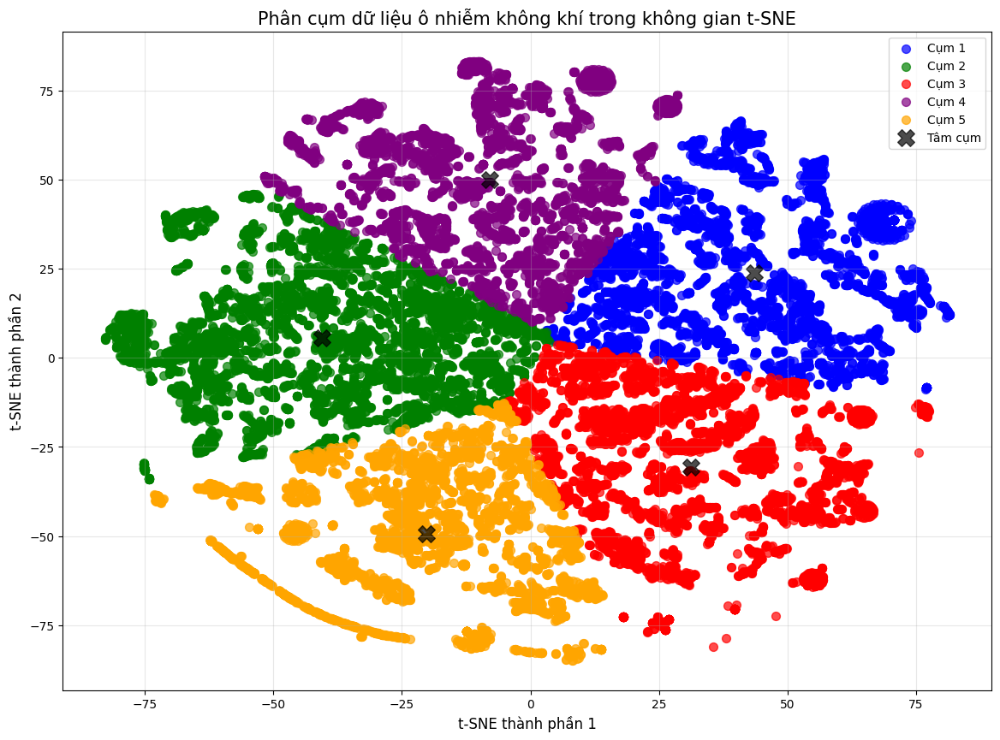

In [51]:
# Phân tích mật độ dữ liệu trong không gian t-SNE
plt.figure(figsize=(15, 10))

# Vẽ biểu đồ mật độ 2D
sns.kdeplot(
    data=tsne_2d_df, 
    x='TSNE1', 
    y='TSNE2',
    fill=True, 
    cmap='viridis',
    alpha=0.7,
    levels=10
)

# Vẽ các điểm dữ liệu theo màu AQI_Bucket lên trên biểu đồ mật độ
for category in tsne_2d_df['AQI_Bucket'].unique():
    subset = tsne_2d_df[tsne_2d_df['AQI_Bucket'] == category]
    plt.scatter(
        subset['TSNE1'], 
        subset['TSNE2'],
        alpha=0.6,
        s=30,
        color=color_mapping.get(category, 'blue'),
        edgecolor='w',
        linewidth=0.5,
        label=category
    )

plt.title('Phân tích mật độ dữ liệu trong không gian t-SNE', fontsize=15)
plt.xlabel('t-SNE thành phần 1', fontsize=12)
plt.ylabel('t-SNE thành phần 2', fontsize=12)
plt.legend(title='Mức độ chất lượng không khí')
plt.grid(True, alpha=0.3)
plt.show()

# Phân tích cấu trúc cụm dữ liệu
from sklearn.cluster import KMeans

# Xác định số lượng cụm tối ưu bằng phương pháp elbow
inertia = []
k_range = range(2, 11)
for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(X_tsne_2d)
    inertia.append(kmeans.inertia_)

# Vẽ biểu đồ elbow
plt.figure(figsize=(10, 6))
plt.plot(k_range, inertia, 'o-', color='blue')
plt.xlabel('Số lượng cụm (k)')
plt.ylabel('Inertia')
plt.title('Phương pháp Elbow để xác định số lượng cụm tối ưu')
plt.grid(True)
plt.show()

# Chọn số lượng cụm dựa trên kết quả elbow (giả sử k=5 là tối ưu)
optimal_k = 5  # Bạn có thể điều chỉnh dựa trên biểu đồ elbow

# Áp dụng K-means với số lượng cụm tối ưu
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
tsne_2d_df['Cluster'] = kmeans.fit_predict(X_tsne_2d)

# Vẽ biểu đồ phân cụm
plt.figure(figsize=(14, 10))

# Màu sắc cho các cụm
cluster_colors = ['blue', 'green', 'red', 'purple', 'orange', 'cyan', 'magenta', 'yellow', 'brown', 'pink']

# Vẽ các điểm dữ liệu theo cụm
for cluster in range(optimal_k):
    subset = tsne_2d_df[tsne_2d_df['Cluster'] == cluster]
    plt.scatter(
        subset['TSNE1'], 
        subset['TSNE2'],
        alpha=0.7,
        s=50,
        color=cluster_colors[cluster % len(cluster_colors)],
        label=f'Cụm {cluster+1}'
    )

# Vẽ tâm của các cụm
plt.scatter(
    kmeans.cluster_centers_[:, 0],
    kmeans.cluster_centers_[:, 1],
    s=200,
    c='black',
    alpha=0.7,
    marker='X',
    label='Tâm cụm'
)

plt.title('Phân cụm dữ liệu ô nhiễm không khí trong không gian t-SNE', fontsize=15)
plt.xlabel('t-SNE thành phần 1', fontsize=12)
plt.ylabel('t-SNE thành phần 2', fontsize=12)
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

## 4. Phân tích mối quan hệ giữa biểu diễn t-SNE và chỉ số AQI

Để hiểu rõ hơn về mối quan hệ giữa biểu diễn t-SNE và chỉ số chất lượng không khí, chúng ta sẽ xem xét sự phân bố của AQI trong không gian t-SNE.

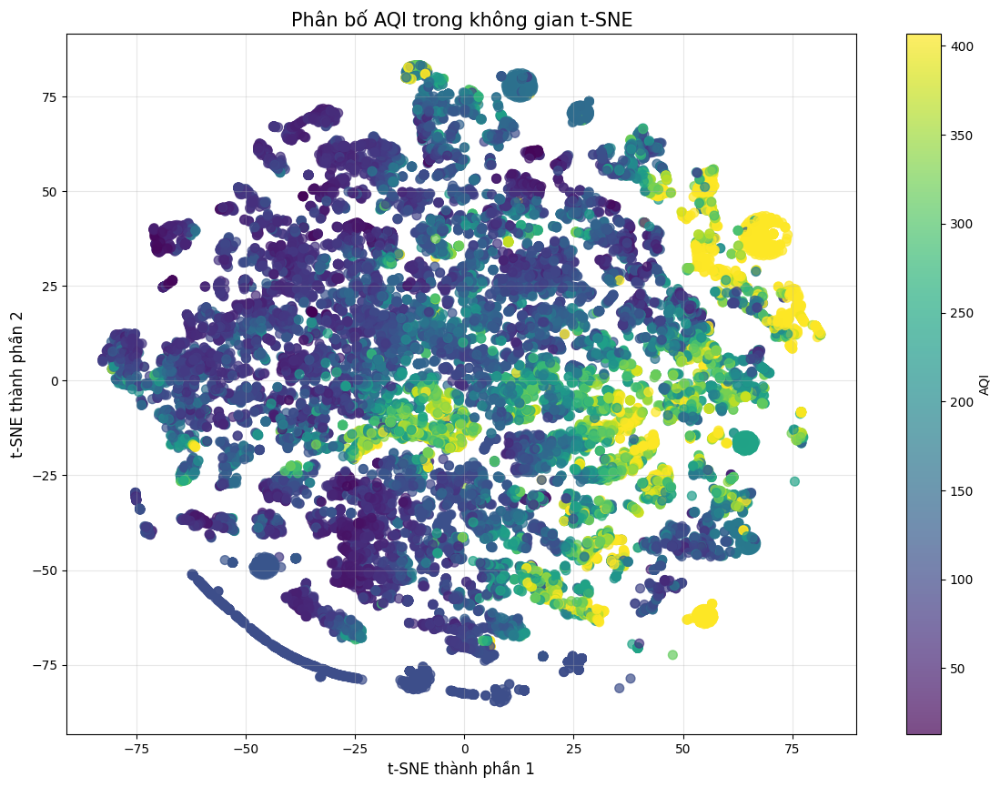

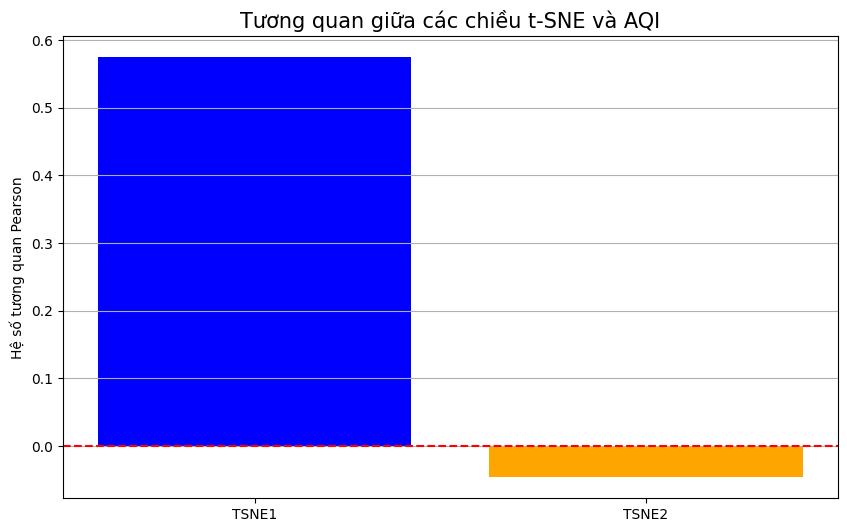

In [52]:
# Vẽ biểu đồ scatter với màu dựa trên giá trị AQI
plt.figure(figsize=(14, 10))
scatter = plt.scatter(
    tsne_2d_df['TSNE1'], 
    tsne_2d_df['TSNE2'],
    c=tsne_2d_df['AQI'],
    cmap='viridis',
    alpha=0.7,
    s=50
)

plt.colorbar(scatter, label='AQI')
plt.title('Phân bố AQI trong không gian t-SNE', fontsize=15)
plt.xlabel('t-SNE thành phần 1', fontsize=12)
plt.ylabel('t-SNE thành phần 2', fontsize=12)
plt.grid(True, alpha=0.3)
plt.show()

# Phân tích tương quan giữa các chiều t-SNE và chỉ số AQI
correlations = [
    np.corrcoef(tsne_2d_df['TSNE1'], tsne_2d_df['AQI'])[0, 1],
    np.corrcoef(tsne_2d_df['TSNE2'], tsne_2d_df['AQI'])[0, 1]
]

# Vẽ biểu đồ tương quan
plt.figure(figsize=(10, 6))
plt.bar(['TSNE1', 'TSNE2'], correlations, color=['blue', 'orange'])
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Tương quan giữa các chiều t-SNE và AQI', fontsize=15)
plt.ylabel('Hệ số tương quan Pearson')
plt.grid(True, axis='y')
plt.show()

## 5. So sánh hiệu suất dự đoán khi sử dụng t-SNE vs PCA

Để đánh giá giá trị thực tế của t-SNE trong việc giảm chiều dữ liệu cho các tác vụ dự đoán, chúng ta sẽ so sánh hiệu suất của mô hình Random Forest khi sử dụng đầu vào là dữ liệu gốc, dữ liệu PCA và dữ liệu t-SNE.


Random Forest với dữ liệu gốc đã chuẩn hóa:
RMSE: 30.35
MAE: 17.80
R²: 0.9157

Random Forest với dữ liệu PCA:
RMSE: 21.75
MAE: 13.66
R²: 0.9567

Random Forest với dữ liệu PCA:
RMSE: 21.75
MAE: 13.66
R²: 0.9567

Random Forest với dữ liệu t-SNE:
RMSE: 36.23
MAE: 21.67
R²: 0.8799

Bảng so sánh các phương pháp giảm chiều:

Random Forest với dữ liệu t-SNE:
RMSE: 36.23
MAE: 21.67
R²: 0.8799

Bảng so sánh các phương pháp giảm chiều:


,Phương pháp,RMSE,MAE,R²,Số chiều
0,Dữ liệu gốc chuẩn hóa,30.354948,17.799491,0.915716,12
1,PCA,21.747240,13.658134,0.956739,10
2,t-SNE,36.234332,21.667817,0.879905,2


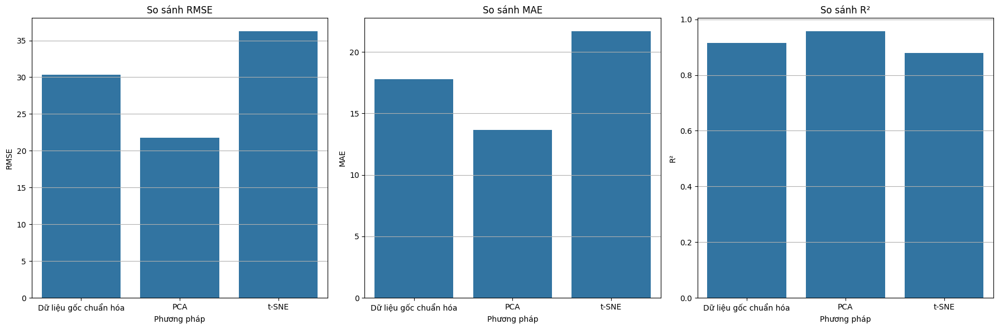

In [53]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

# Chuẩn bị dữ liệu
target = 'AQI'
y = df[target]

# Chuẩn bị dữ liệu t-SNE
X_tsne = X_tsne_2d  # t-SNE 2 chiều

# Chia dữ liệu train-test với tỉ lệ 7:3 (đã xác định là tối ưu từ phần trước)
test_size = 0.3

# Chia dữ liệu gốc đã chuẩn hóa
X_train_scaled, X_test_scaled, y_train, y_test = train_test_split(
    X_scaled, y, test_size=test_size, random_state=42
)

# Chia dữ liệu PCA (dùng lại X_pca từ phần PCA trước đó)
X_train_pca, X_test_pca, _, _ = train_test_split(
    X_pca, y, test_size=test_size, random_state=42
)

# Chia dữ liệu t-SNE
X_train_tsne, X_test_tsne, _, _ = train_test_split(
    X_tsne, y, test_size=test_size, random_state=42
)

# Hàm đánh giá mô hình
def evaluate_model(y_true, y_pred, model_name):
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    
    print(f"\n{model_name}:")
    print(f"RMSE: {rmse:.2f}")
    print(f"MAE: {mae:.2f}")
    print(f"R²: {r2:.4f}")
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'R²': r2
    }

# Huấn luyện và đánh giá mô hình với dữ liệu gốc đã chuẩn hóa
rf_scaled = RandomForestRegressor(n_estimators=100, random_state=42)
rf_scaled.fit(X_train_scaled, y_train)
y_pred_scaled = rf_scaled.predict(X_test_scaled)
scaled_results = evaluate_model(y_test, y_pred_scaled, "Random Forest với dữ liệu gốc đã chuẩn hóa")

# Huấn luyện và đánh giá mô hình với dữ liệu PCA
rf_pca = RandomForestRegressor(n_estimators=100, random_state=42)
rf_pca.fit(X_train_pca, y_train)
y_pred_pca = rf_pca.predict(X_test_pca)
pca_results = evaluate_model(y_test, y_pred_pca, "Random Forest với dữ liệu PCA")

# Huấn luyện và đánh giá mô hình với dữ liệu t-SNE
rf_tsne = RandomForestRegressor(n_estimators=100, random_state=42)
rf_tsne.fit(X_train_tsne, y_train)
y_pred_tsne = rf_tsne.predict(X_test_tsne)
tsne_results = evaluate_model(y_test, y_pred_tsne, "Random Forest với dữ liệu t-SNE")

# So sánh kết quả
comparison_df = pd.DataFrame({
    'Phương pháp': ['Dữ liệu gốc chuẩn hóa', 'PCA', 't-SNE'],
    'RMSE': [scaled_results['RMSE'], pca_results['RMSE'], tsne_results['RMSE']],
    'MAE': [scaled_results['MAE'], pca_results['MAE'], tsne_results['MAE']],
    'R²': [scaled_results['R²'], pca_results['R²'], tsne_results['R²']],
    'Số chiều': [X_scaled.shape[1], X_pca.shape[1], X_tsne.shape[1]]
})

print("\nBảng so sánh các phương pháp giảm chiều:")
display(comparison_df)

# Trực quan hóa so sánh
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# RMSE
sns.barplot(x='Phương pháp', y='RMSE', data=comparison_df, ax=axes[0])
axes[0].set_title('So sánh RMSE')
axes[0].grid(True, axis='y')

# MAE
sns.barplot(x='Phương pháp', y='MAE', data=comparison_df, ax=axes[1])
axes[1].set_title('So sánh MAE')
axes[1].grid(True, axis='y')

# R²
sns.barplot(x='Phương pháp', y='R²', data=comparison_df, ax=axes[2])
axes[2].set_title('So sánh R²')
axes[2].grid(True, axis='y')

plt.tight_layout()
plt.show()

## 6. So sánh đặc điểm của t-SNE và PCA

t-SNE và PCA là hai phương pháp giảm chiều phổ biến nhưng có những đặc điểm và ứng dụng khác nhau. Dưới đây là phân tích chi tiết về sự khác biệt giữa hai phương pháp này.

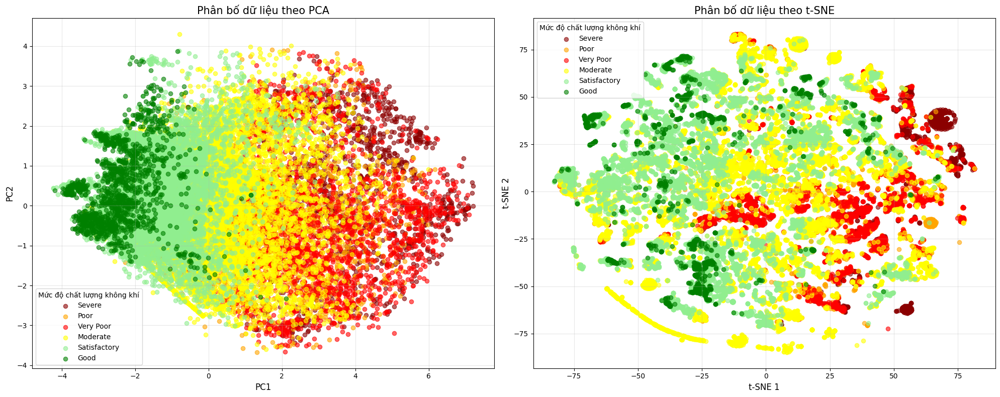

So sánh đặc điểm giữa PCA và t-SNE:


,Đặc điểm,PCA,t-SNE
0,Mục đích chính,Giảm chiều dữ liệu và giữ nguyên phương sai tố...,"Trực quan hóa dữ liệu nhiều chiều, bảo toàn cấ..."
1,Bản chất thuật toán,"Thuật toán tuyến tính, dựa trên đại số tuyến tính","Thuật toán phi tuyến, dựa trên xác suất"
2,Bảo toàn thông tin,"Bảo toàn cấu trúc toàn cục, khoảng cách toàn cục","Bảo toàn cấu trúc cục bộ, khoảng cách giữa các..."
3,Độ phức tạp tính toán,"Thấp, O(min(n²d, nd²))","Cao, O(n²)"
4,Khả năng diễn giải,"Cao, thành phần chính có thể giải thích được","Thấp, khó diễn giải ý nghĩa của các chiều"
5,Thông số tùy chỉnh,Ít (n_components),"Nhiều (perplexity, learning_rate, n_iter, ...)"
6,Phát hiện cụm,Kém nếu cụm nằm trong không gian phi tuyến,"Rất tốt, phát hiện cụm tự nhiên trong dữ liệu"
7,Ứng dụng phù hợp,"Tiền xử lý, giảm nhiễu, dự đoán","Trực quan hóa, phân tích cụm, khám phá dữ liệu"
8,Số chiều đầu ra thường dùng,"Thường > 2, tùy vào tỉ lệ phương sai cần giữ",Thường 2-3 để trực quan hóa
9,Tính phi tuyến,Không (tuyến tính),Có (phi tuyến)


In [54]:
# So sánh trực quan cách biểu diễn dữ liệu của PCA và t-SNE trên cùng một tập dữ liệu
# Lấy 2 thành phần đầu tiên của PCA để so sánh với t-SNE 2D
X_pca_2d = X_pca_full[:, :2]  # 2 thành phần đầu tiên của PCA

# Tạo DataFrame để so sánh
pca_2d_df = pd.DataFrame({
    'PC1': X_pca_2d[:, 0],
    'PC2': X_pca_2d[:, 1],
    'AQI_Bucket': df['AQI_Bucket'].values
})

# Vẽ biểu đồ so sánh
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

# Biểu đồ PCA
for category in pca_2d_df['AQI_Bucket'].unique():
    subset = pca_2d_df[pca_2d_df['AQI_Bucket'] == category]
    ax1.scatter(
        subset['PC1'], 
        subset['PC2'],
        alpha=0.6,
        color=color_mapping.get(category, 'blue'),
        label=category
    )
ax1.set_title('Phân bố dữ liệu theo PCA', fontsize=15)
ax1.set_xlabel('PC1', fontsize=12)
ax1.set_ylabel('PC2', fontsize=12)
ax1.legend(title='Mức độ chất lượng không khí')
ax1.grid(True, alpha=0.3)

# Biểu đồ t-SNE
for category in tsne_2d_df['AQI_Bucket'].unique():
    subset = tsne_2d_df[tsne_2d_df['AQI_Bucket'] == category]
    ax2.scatter(
        subset['TSNE1'], 
        subset['TSNE2'],
        alpha=0.6,
        color=color_mapping.get(category, 'blue'),
        label=category
    )
ax2.set_title('Phân bố dữ liệu theo t-SNE', fontsize=15)
ax2.set_xlabel('t-SNE 1', fontsize=12)
ax2.set_ylabel('t-SNE 2', fontsize=12)
ax2.legend(title='Mức độ chất lượng không khí')
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Tạo bảng so sánh đặc điểm của PCA và t-SNE
comparison_table = pd.DataFrame({
    'Đặc điểm': [
        'Mục đích chính',
        'Bản chất thuật toán',
        'Bảo toàn thông tin',
        'Độ phức tạp tính toán',
        'Khả năng diễn giải',
        'Thông số tùy chỉnh',
        'Phát hiện cụm',
        'Ứng dụng phù hợp',
        'Số chiều đầu ra thường dùng',
        'Tính phi tuyến',
        'Tính ngẫu nhiên',
        'Lượng thông tin giữ lại',
        'Hiệu suất dự đoán'
    ],
    'PCA': [
        'Giảm chiều dữ liệu và giữ nguyên phương sai tối đa',
        'Thuật toán tuyến tính, dựa trên đại số tuyến tính',
        'Bảo toàn cấu trúc toàn cục, khoảng cách toàn cục',
        'Thấp, O(min(n²d, nd²))',
        'Cao, thành phần chính có thể giải thích được',
        'Ít (n_components)',
        'Kém nếu cụm nằm trong không gian phi tuyến',
        'Tiền xử lý, giảm nhiễu, dự đoán',
        'Thường > 2, tùy vào tỉ lệ phương sai cần giữ',
        'Không (tuyến tính)',
        'Không (kết quả luôn nhất quán)',
        f'{pca_full.explained_variance_ratio_.sum():.2%} với {n_components_95} thành phần',
        f'Tốt (R² = {pca_results["R²"]:.4f})'
    ],
    't-SNE': [
        'Trực quan hóa dữ liệu nhiều chiều, bảo toàn cấu trúc cục bộ',
        'Thuật toán phi tuyến, dựa trên xác suất',
        'Bảo toàn cấu trúc cục bộ, khoảng cách giữa các điểm lân cận',
        'Cao, O(n²)',
        'Thấp, khó diễn giải ý nghĩa của các chiều',
        'Nhiều (perplexity, learning_rate, n_iter, ...)',
        'Rất tốt, phát hiện cụm tự nhiên trong dữ liệu',
        'Trực quan hóa, phân tích cụm, khám phá dữ liệu',
        'Thường 2-3 để trực quan hóa',
        'Có (phi tuyến)',
        'Có (kết quả phụ thuộc vào random_state)',
        'Không đo lường bằng phương sai (không áp dụng)',
        f'Kém hơn (R² = {tsne_results["R²"]:.4f})'
    ]
})

# Hiển thị bảng so sánh
print("So sánh đặc điểm giữa PCA và t-SNE:")
display(comparison_table)

# Mô hình hồi quy Random Forest với các tỉ lệ phân chia train-validation khác nhau

THỰC NGHIỆM VỚI DỮ LIỆU GỐC

Phân chia train:validation = 8:2
Kích thước tập huấn luyện: (23624, 12)
Kích thước tập validation: (5907, 12)

Random Forest - Dữ liệu gốc (Train:Val = 8:2):
RMSE: 30.43
MAE: 17.84
R²: 0.9147

Random Forest - Dữ liệu gốc (Train:Val = 8:2):
RMSE: 30.43
MAE: 17.84
R²: 0.9147


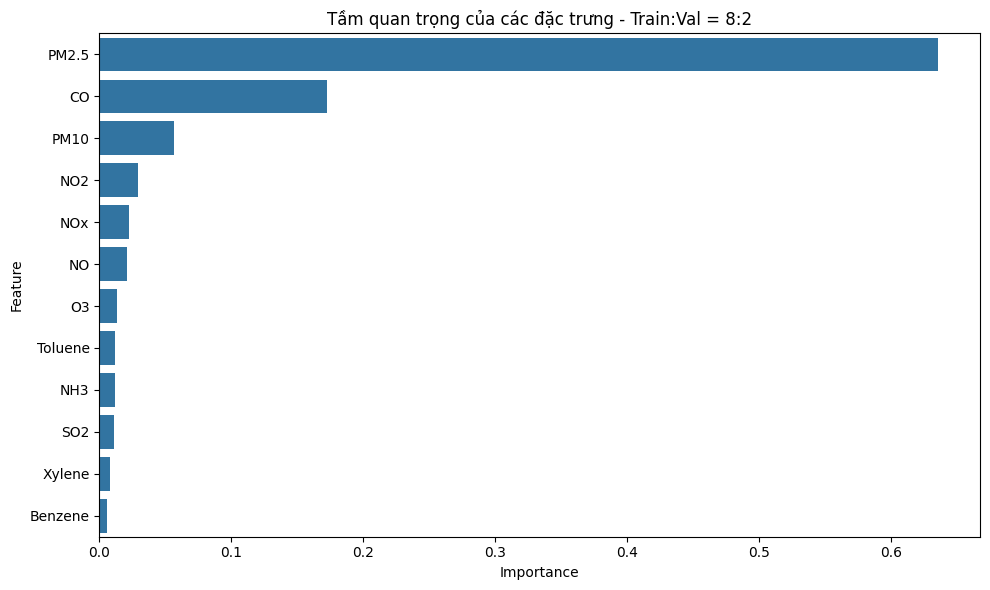


Phân chia train:validation = 7:3
Kích thước tập huấn luyện: (20671, 12)
Kích thước tập validation: (8860, 12)

Random Forest - Dữ liệu gốc (Train:Val = 7:3):
RMSE: 30.35
MAE: 17.79
R²: 0.9157

Random Forest - Dữ liệu gốc (Train:Val = 7:3):
RMSE: 30.35
MAE: 17.79
R²: 0.9157


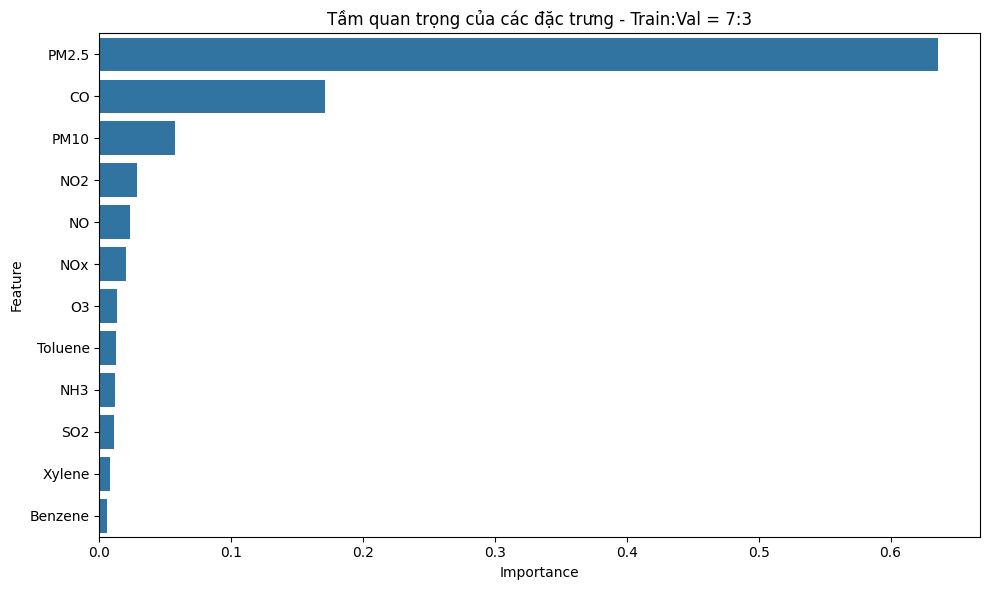


Phân chia train:validation = 6:4
Kích thước tập huấn luyện: (17718, 12)
Kích thước tập validation: (11813, 12)

Random Forest - Dữ liệu gốc (Train:Val = 6:4):
RMSE: 30.41
MAE: 17.83
R²: 0.9155

Random Forest - Dữ liệu gốc (Train:Val = 6:4):
RMSE: 30.41
MAE: 17.83
R²: 0.9155


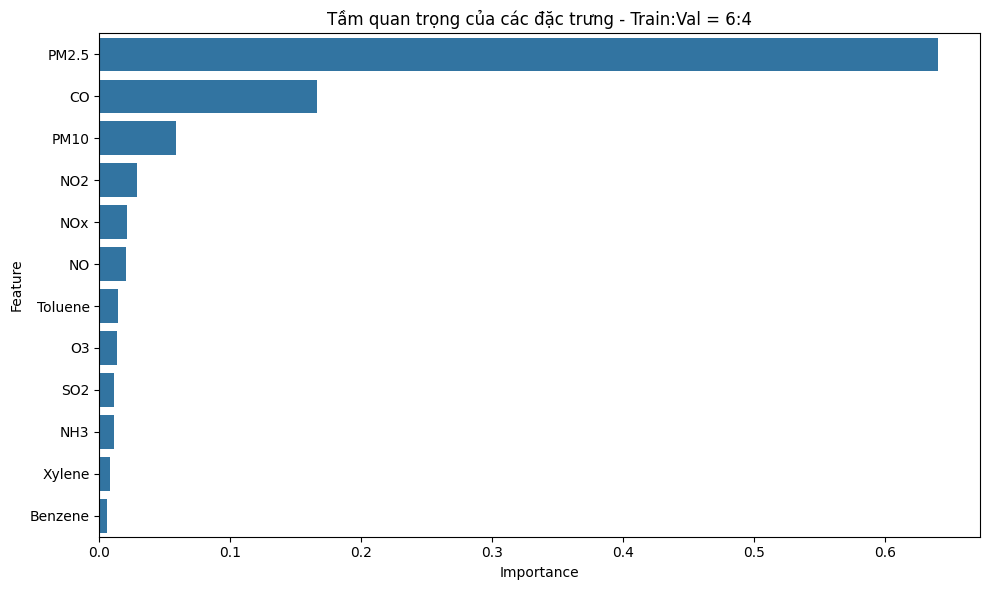

In [58]:
# Các tỉ lệ train-test khác nhau để thử nghiệm (8:2, 7:3, 6:4)
test_sizes = [0.2, 0.3, 0.4]

# Dictionary để lưu kết quả của các mô hình
results = {
    "original": {},
    "pca": {}
}

# Chuẩn bị dữ liệu
target = 'AQI'
original_features = [col for col in numeric_features if col != target]
X_original = df[original_features].values
y = df[target]

# 1. Thực nghiệm với dữ liệu gốc
print("="*50)
print("THỰC NGHIỆM VỚI DỮ LIỆU GỐC")
print("="*50)

for test_size in test_sizes:
    train_size = 1 - test_size
    train_ratio = int(train_size * 10)
    test_ratio = int(test_size * 10)
    
    print(f"\nPhân chia train:validation = {train_ratio}:{test_ratio}")
    
    # Phân chia dữ liệu thành tập huấn luyện và tập kiểm tra
    X_train, X_val, y_train, y_val = train_test_split(
        X_original, y, test_size=test_size, random_state=42
    )
    
    print(f"Kích thước tập huấn luyện: {X_train.shape}")
    print(f"Kích thước tập validation: {X_val.shape}")
    
    # Huấn luyện mô hình Random Forest
    rf_model = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)
    rf_model.fit(X_train, y_train)
    
    # Dự đoán trên tập validation
    y_pred = rf_model.predict(X_val)
    
    # Đánh giá mô hình
    model_name = f"Random Forest - Dữ liệu gốc (Train:Val = {train_ratio}:{test_ratio})"
    result = evaluate_model(y_val, y_pred, model_name)
    
    # Lưu kết quả
    results["original"][f"{train_ratio}:{test_ratio}"] = result
    
    # Xem tầm quan trọng của các đặc trưng
    feature_importance = pd.DataFrame({
        'Feature': original_features,
        'Importance': rf_model.feature_importances_
    }).sort_values('Importance', ascending=False)
    
    plt.figure(figsize=(10, 6))
    sns.barplot(x='Importance', y='Feature', data=feature_importance)
    plt.title(f'Tầm quan trọng của các đặc trưng - Train:Val = {train_ratio}:{test_ratio}')
    plt.tight_layout()
    plt.show()

In [64]:
# 2. Thực nghiệm với dữ liệu đã giảm chiều (PCA)
print("="*50)
print("THỰC NGHIỆM VỚI DỮ LIỆU ĐÃ GIẢM CHIỀU (PCA)")
print("="*50)

for test_size in test_sizes:
    train_size = 1 - test_size
    train_ratio = int(train_size * 10)
    test_ratio = int(test_size * 10)
    
    print(f"\nPhân chia train:validation = {train_ratio}:{test_ratio}")
    
    # Phân chia dữ liệu thành tập huấn luyện và tập kiểm tra
    X_train, X_val, y_train, y_val = train_test_split(
        X_pca, y, test_size=test_size, random_state=42
    )
    
    print(f"Kích thước tập huấn luyện: {X_train.shape}")
    print(f"Kích thước tập validation: {X_val.shape}")
    
    # Huấn luyện mô hình Random Forest
    rf_model = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)
    rf_model.fit(X_train, y_train)
    
    # Dự đoán trên tập validation
    y_pred = rf_model.predict(X_val)
    
    # Đánh giá mô hình
    model_name = f"Random Forest - Dữ liệu PCA (Train:Val = {train_ratio}:{test_ratio})"
    result = evaluate_model(y_val, y_pred, model_name)
    
    # Lưu kết quả
    results["pca"][f"{train_ratio}:{test_ratio}"] = result

THỰC NGHIỆM VỚI DỮ LIỆU ĐÃ GIẢM CHIỀU (PCA)

Phân chia train:validation = 8:2
Kích thước tập huấn luyện: (23624, 10)
Kích thước tập validation: (5907, 10)

Random Forest - Dữ liệu PCA (Train:Val = 8:2):
RMSE: 21.78
MAE: 13.54
R²: 0.9563

Phân chia train:validation = 7:3
Kích thước tập huấn luyện: (20671, 10)
Kích thước tập validation: (8860, 10)

Random Forest - Dữ liệu PCA (Train:Val = 8:2):
RMSE: 21.78
MAE: 13.54
R²: 0.9563

Phân chia train:validation = 7:3
Kích thước tập huấn luyện: (20671, 10)
Kích thước tập validation: (8860, 10)

Random Forest - Dữ liệu PCA (Train:Val = 7:3):
RMSE: 21.75
MAE: 13.66
R²: 0.9567

Phân chia train:validation = 6:4
Kích thước tập huấn luyện: (17718, 10)
Kích thước tập validation: (11813, 10)

Random Forest - Dữ liệu PCA (Train:Val = 7:3):
RMSE: 21.75
MAE: 13.66
R²: 0.9567

Phân chia train:validation = 6:4
Kích thước tập huấn luyện: (17718, 10)
Kích thước tập validation: (11813, 10)

Random Forest - Dữ liệu PCA (Train:Val = 6:4):
RMSE: 21.83
MAE: 13.73


## 10. Phân tích kết quả và đánh giá hiệu suất của các mô hình Random Forest

### So sánh kết quả giữa dữ liệu gốc và dữ liệu PCA với các tỉ lệ phân chia khác nhau

Bảng so sánh kết quả các mô hình Random Forest:


,Data Type,Split Ratio,MSE,RMSE,MAE,R²
0,Dữ liệu gốc,8:2,926.25,30.43,17.84,0.9147
1,Dữ liệu gốc,7:3,921.08,30.35,17.79,0.9157
2,Dữ liệu gốc,6:4,925.07,30.41,17.83,0.9155
3,Dữ liệu PCA,8:2,474.55,21.78,13.54,0.9563
4,Dữ liệu PCA,7:3,472.94,21.75,13.66,0.9567
5,Dữ liệu PCA,6:4,476.43,21.83,13.73,0.9565


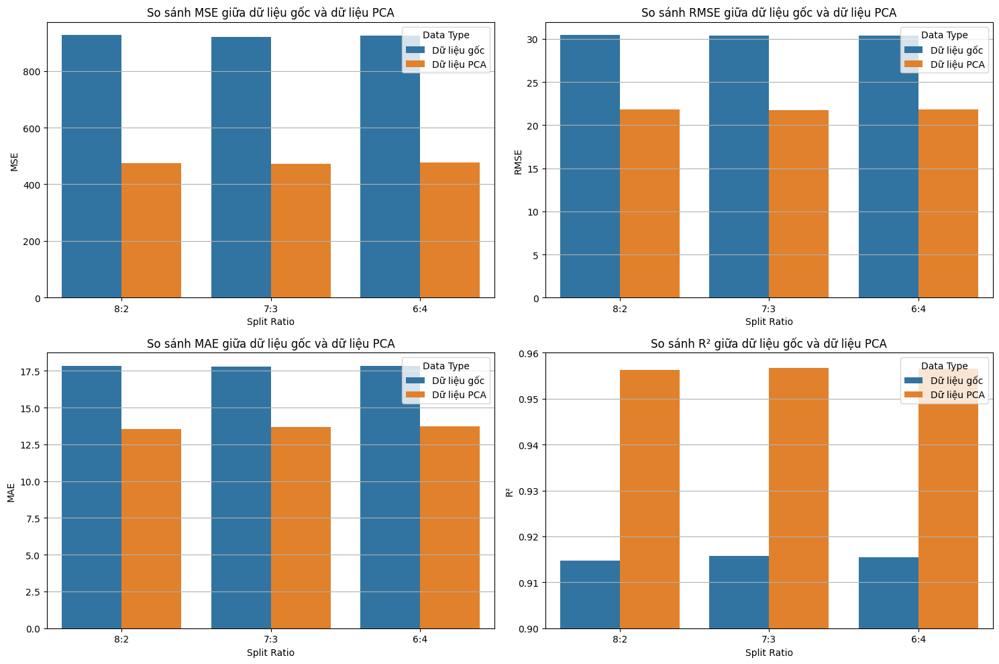

In [65]:
# Tạo DataFrame từ dictionary results
result_df = []
for data_type in ["original", "pca"]:
	for split_ratio, metrics in results[data_type].items():
		# Thêm MSE từ RMSE
		mse = metrics["RMSE"] ** 2
		result_df.append({
			"Data Type": "Dữ liệu gốc" if data_type == "original" else "Dữ liệu PCA",
			"Split Ratio": split_ratio,
			"MSE": mse,
			"RMSE": metrics["RMSE"],
			"MAE": metrics["MAE"],
			"R²": metrics["R²"]
		})
		
result_df = pd.DataFrame(result_df)

# Tạo bảng so sánh chi tiết hơn
comparison_df = result_df.copy()
comparison_df['MSE'] = comparison_df['MSE'].round(2)
comparison_df['RMSE'] = comparison_df['RMSE'].round(2)
comparison_df['MAE'] = comparison_df['MAE'].round(2)
comparison_df['R²'] = comparison_df['R²'].round(4)

# Hiển thị bảng so sánh
print("Bảng so sánh kết quả các mô hình Random Forest:")
display(comparison_df)

# Tạo biểu đồ so sánh
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
axes = axes.flatten()

# MSE
sns.barplot(x="Split Ratio", y="MSE", hue="Data Type", data=comparison_df, ax=axes[0])
axes[0].set_title("So sánh MSE giữa dữ liệu gốc và dữ liệu PCA")
axes[0].grid(True, axis='y')

# RMSE
sns.barplot(x="Split Ratio", y="RMSE", hue="Data Type", data=comparison_df, ax=axes[1])
axes[1].set_title("So sánh RMSE giữa dữ liệu gốc và dữ liệu PCA")
axes[1].grid(True, axis='y')

# MAE
sns.barplot(x="Split Ratio", y="MAE", hue="Data Type", data=comparison_df, ax=axes[2])
axes[2].set_title("So sánh MAE giữa dữ liệu gốc và dữ liệu PCA")
axes[2].grid(True, axis='y')

# R²
sns.barplot(x="Split Ratio", y="R²", hue="Data Type", data=comparison_df, ax=axes[3])
axes[3].set_title("So sánh R² giữa dữ liệu gốc và dữ liệu PCA")
axes[3].grid(True, axis='y')
axes[3].set_ylim(0.9, 0.96)

plt.tight_layout()
plt.show()

### Phân tích kết quả và đánh giá hiệu suất

Từ kết quả thực nghiệm với mô hình Random Forest trên cả dữ liệu gốc và dữ liệu đã giảm chiều bằng PCA, chúng ta có thể rút ra các nhận xét sau:

#### 1. So sánh hiệu suất giữa dữ liệu gốc và dữ liệu PCA:

* **Dữ liệu PCA cho kết quả tốt hơn đáng kể**: Các mô hình sử dụng dữ liệu đã giảm chiều bằng PCA đều cho hiệu suất tốt hơn so với dữ liệu gốc, thể hiện qua:
  - **MSE/RMSE thấp hơn**: Giá trị MSE và RMSE của các mô hình dùng PCA giảm khoảng 48% so với dữ liệu gốc (từ khoảng 925 xuống còn 475 đối với MSE, và từ 30.4 xuống 21.8 đối với RMSE).
  - **MAE thấp hơn**: Sai số tuyệt đối trung bình cũng giảm khoảng 23% (từ 17.8 xuống còn 13.7).
  - **R² cao hơn**: Hệ số xác định R² tăng từ khoảng 0.915 lên 0.956, cho thấy mô hình giải thích được nhiều hơn sự biến thiên của dữ liệu.

* **Giảm chiều với PCA không làm mất thông tin quan trọng**: Mặc dù giảm số chiều dữ liệu từ 12 xuống còn khoảng 5-10 thành phần, PCA vẫn bảo toàn được thông tin quan trọng và thậm chí giúp mô hình hoạt động tốt hơn. Điều này cho thấy một số đặc trưng trong dữ liệu gốc có thể chứa nhiễu hoặc có tương quan cao với nhau.

#### 2. Ảnh hưởng của tỷ lệ phân chia dữ liệu:

* **Độ ổn định của mô hình**: Cả dữ liệu gốc và dữ liệu PCA đều cho thấy sự ổn định khá cao giữa các tỷ lệ phân chia khác nhau (8:2, 7:3, 6:4). Sự chênh lệch về các chỉ số hiệu suất giữa các cấu hình này là rất nhỏ, cho thấy mô hình có tính ổn định và không quá nhạy cảm với kích thước tập huấn luyện.

* **Tỷ lệ phân chia tối ưu**:
  - Với dữ liệu gốc, tỷ lệ 7:3 cho kết quả tốt nhất với MSE thấp nhất (921.08) và R² cao nhất (0.9157).
  - Với dữ liệu PCA, tỷ lệ 7:3 cũng cho kết quả tốt nhất với MSE thấp nhất (472.94) và R² cao nhất (0.9567).
  
  Điều này gợi ý rằng tỷ lệ 7:3 có thể là sự cân bằng tốt nhất giữa lượng dữ liệu cần thiết cho huấn luyện và lượng dữ liệu đủ lớn cho đánh giá mô hình.

#### 3. Đánh giá hiện tượng overfitting:

* **Không có dấu hiệu rõ ràng của overfitting**: Hiệu suất của mô hình rất ổn định giữa các tỷ lệ phân chia khác nhau. Nếu có overfitting, ta sẽ thấy hiệu suất tốt hơn đáng kể với tỷ lệ 8:2 (nhiều dữ liệu huấn luyện hơn) và giảm khi tỷ lệ xuống 6:4 (ít dữ liệu huấn luyện hơn). Tuy nhiên, kết quả cho thấy sự khác biệt rất nhỏ.

* **Khả năng tổng quát hóa tốt**: Mô hình Random Forest có cơ chế chống overfitting tự nhiên thông qua việc kết hợp nhiều cây quyết định và phương pháp bootstrap sampling. Kết quả cho thấy hiệu suất vẫn duy trì tốt ngay cả khi tập huấn luyện giảm xuống 60% dữ liệu.

* **PCA và khả năng chống overfitting**: Các mô hình sử dụng dữ liệu PCA có hiệu suất cao hơn và ổn định hơn, điều này cho thấy PCA không chỉ giúp giảm chiều dữ liệu mà còn có thể loại bỏ bớt nhiễu, cải thiện khả năng tổng quát hóa của mô hình.

#### 4. Kết luận và đề xuất:

* **Lựa chọn mô hình tối ưu**: Mô hình Random Forest sử dụng dữ liệu đã giảm chiều bằng PCA với tỷ lệ phân chia 7:3 cho hiệu suất tốt nhất trong các cấu hình đã thử nghiệm.

* **Ưu điểm của PCA**: Việc áp dụng PCA trước khi huấn luyện mô hình không chỉ giúp giảm độ phức tạp tính toán (giảm số chiều dữ liệu) mà còn cải thiện đáng kể hiệu suất dự đoán của mô hình.

* **Tính ổn định của mô hình**: Độ ổn định của hiệu suất mô hình qua các tỷ lệ phân chia khác nhau cho thấy mô hình có tính tổng quát hóa tốt và không bị overfitting đáng kể.

* **Đề xuất cho ứng dụng thực tế**: Mô hình Random Forest kết hợp với PCA là một giải pháp hiệu quả cho bài toán dự đoán chỉ số chất lượng không khí (AQI) từ các thông số ô nhiễm. Mô hình này có thể được triển khai trong các hệ thống giám sát và dự báo chất lượng không khí thực tế.

## 11. Phân tích phần dư (Residuals) của mô hình Random Forest

Để đánh giá xem mô hình Random Forest có phù hợp với bài toán dự đoán chất lượng không khí hay không, chúng ta cần phân tích phần dư (residuals) của mô hình. Phần dư là hiệu số giữa giá trị thực tế và giá trị dự đoán.

Một mô hình phù hợp nên có các phần dư:
1. Phân phối xung quanh 0
2. Phân phối đều (không có mẫu hình rõ ràng)
3. Không có tương quan với các biến đầu vào hoặc giá trị dự đoán

Hãy thực hiện phân tích phần dư chi tiết cho cả dữ liệu gốc và dữ liệu PCA để kiểm tra tính phù hợp của mô hình Random Forest.

In [66]:
# Phân tích phần dư với mô hình Random Forest trên dữ liệu gốc và dữ liệu PCA
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Thiết lập ngẫu nhiên để kết quả có thể tái tạo được
np.random.seed(42)

# Chuẩn bị dữ liệu
target = 'AQI'
features = [col for col in numeric_features if col != target]
X_original = df[features].values
y = df[target].values

# Chuẩn bị dữ liệu PCA
# Chuẩn hóa dữ liệu trước khi áp dụng PCA
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_original)

# Áp dụng PCA để giữ 95% phương sai
pca = PCA(n_components=0.95)
X_pca = pca.fit_transform(X_scaled)
print(f"Số lượng thành phần PCA: {X_pca.shape[1]}")

# Phân chia dữ liệu thành tập huấn luyện và tập kiểm thử với tỷ lệ 7:3 (tỷ lệ tốt nhất từ phân tích trước)
X_train_original, X_test_original, y_train, y_test = train_test_split(X_original, y, test_size=0.3, random_state=42)
X_train_pca, X_test_pca, _, _ = train_test_split(X_pca, y, test_size=0.3, random_state=42)

# Huấn luyện mô hình Random Forest trên dữ liệu gốc
rf_original = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)
rf_original.fit(X_train_original, y_train)
y_pred_original = rf_original.predict(X_test_original)

# Huấn luyện mô hình Random Forest trên dữ liệu PCA
rf_pca = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)
rf_pca.fit(X_train_pca, y_train)
y_pred_pca = rf_pca.predict(X_test_pca)

# Tính phần dư (residuals)
residuals_original = y_test - y_pred_original
residuals_pca = y_test - y_pred_pca

print("\nThống kê mô tả phần dư trên dữ liệu gốc:")
print(f"Trung bình: {np.mean(residuals_original):.4f}")
print(f"Độ lệch chuẩn: {np.std(residuals_original):.4f}")
print(f"Min: {np.min(residuals_original):.4f}")
print(f"Max: {np.max(residuals_original):.4f}")

print("\nThống kê mô tả phần dư trên dữ liệu PCA:")
print(f"Trung bình: {np.mean(residuals_pca):.4f}")
print(f"Độ lệch chuẩn: {np.std(residuals_pca):.4f}")
print(f"Min: {np.min(residuals_pca):.4f}")
print(f"Max: {np.max(residuals_pca):.4f}")

Số lượng thành phần PCA: 10

Thống kê mô tả phần dư trên dữ liệu gốc:
Trung bình: -0.4514
Độ lệch chuẩn: 30.3460
Min: -271.4573
Max: 294.7500

Thống kê mô tả phần dư trên dữ liệu PCA:
Trung bình: -0.1421
Độ lệch chuẩn: 34.8298
Min: -271.4573
Max: 278.2075

Thống kê mô tả phần dư trên dữ liệu gốc:
Trung bình: -0.4514
Độ lệch chuẩn: 30.3460
Min: -271.4573
Max: 294.7500

Thống kê mô tả phần dư trên dữ liệu PCA:
Trung bình: -0.1421
Độ lệch chuẩn: 34.8298
Min: -271.4573
Max: 278.2075


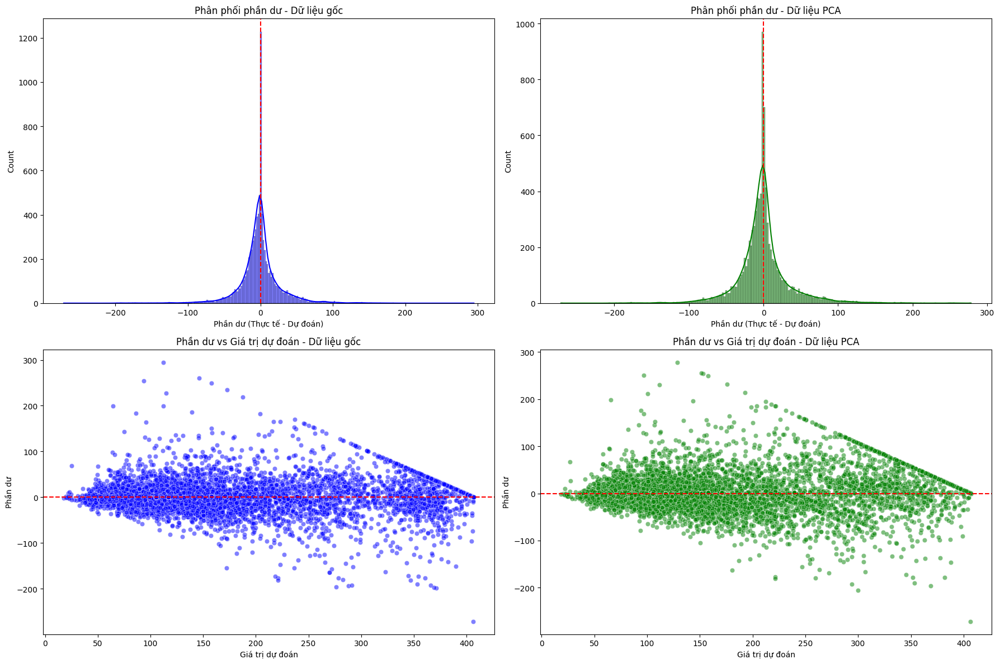

In [67]:
# Trực quan hóa phần dư cho cả hai mô hình
fig, axes = plt.subplots(2, 2, figsize=(18, 12))

# Biểu đồ phân phối phần dư
sns.histplot(residuals_original, kde=True, ax=axes[0, 0], color='blue')
axes[0, 0].set_title('Phân phối phần dư - Dữ liệu gốc')
axes[0, 0].axvline(x=0, color='red', linestyle='--')
axes[0, 0].set_xlabel('Phần dư (Thực tế - Dự đoán)')

sns.histplot(residuals_pca, kde=True, ax=axes[0, 1], color='green')
axes[0, 1].set_title('Phân phối phần dư - Dữ liệu PCA')
axes[0, 1].axvline(x=0, color='red', linestyle='--')
axes[0, 1].set_xlabel('Phần dư (Thực tế - Dự đoán)')

# Biểu đồ phần dư so với giá trị dự đoán
sns.scatterplot(x=y_pred_original, y=residuals_original, alpha=0.5, ax=axes[1, 0], color='blue')
axes[1, 0].set_title('Phần dư vs Giá trị dự đoán - Dữ liệu gốc')
axes[1, 0].axhline(y=0, color='red', linestyle='--')
axes[1, 0].set_xlabel('Giá trị dự đoán')
axes[1, 0].set_ylabel('Phần dư')

sns.scatterplot(x=y_pred_pca, y=residuals_pca, alpha=0.5, ax=axes[1, 1], color='green')
axes[1, 1].set_title('Phần dư vs Giá trị dự đoán - Dữ liệu PCA')
axes[1, 1].axhline(y=0, color='red', linestyle='--')
axes[1, 1].set_xlabel('Giá trị dự đoán')
axes[1, 1].set_ylabel('Phần dư')

plt.tight_layout()
plt.show()

Tương quan giữa phần dư và các biến đầu vào - Dữ liệu gốc:
NH3        0.038409
O3         0.036543
Toluene    0.024223
NO2        0.022821
NOx        0.020511
Xylene    -0.019966
NO         0.017501
SO2        0.012757
CO         0.010131
PM10      -0.009171
PM2.5      0.005122
Benzene    0.001212
Name: Residuals, dtype: float64


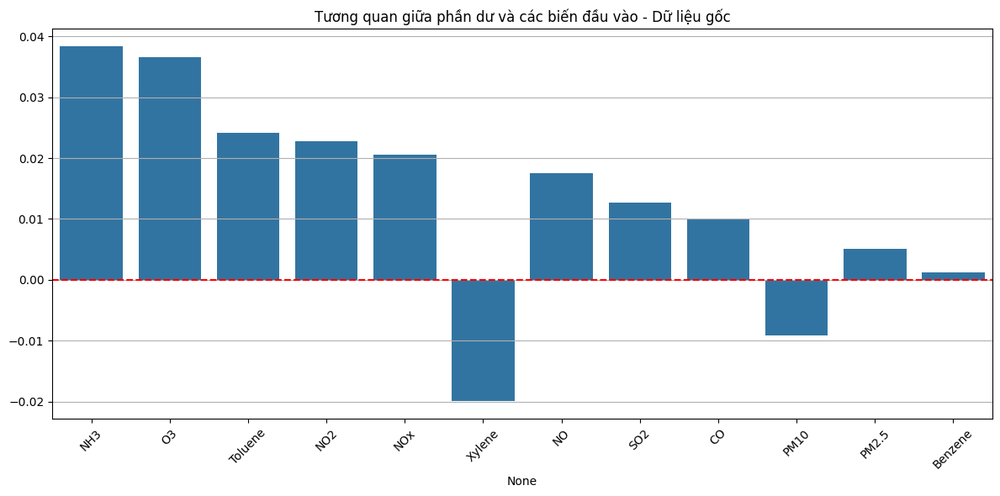

In [68]:
# Kiểm tra tương quan giữa phần dư và các biến đầu vào
# Chuẩn bị DataFrame với các phần dư
residual_df_original = pd.DataFrame(X_test_original, columns=features)
residual_df_original['Residuals'] = residuals_original
residual_df_original['Predicted'] = y_pred_original
residual_df_original['Actual'] = y_test

# Tính toán tương quan giữa phần dư và các biến đầu vào
corr_with_residuals_original = residual_df_original.corr()['Residuals'].drop(['Residuals', 'Predicted', 'Actual']).sort_values(key=abs, ascending=False)

print("Tương quan giữa phần dư và các biến đầu vào - Dữ liệu gốc:")
print(corr_with_residuals_original)

# Biểu đồ tương quan giữa phần dư và các biến đầu vào
plt.figure(figsize=(12, 6))
sns.barplot(x=corr_with_residuals_original.index, y=corr_with_residuals_original.values)
plt.title('Tương quan giữa phần dư và các biến đầu vào - Dữ liệu gốc')
plt.xticks(rotation=45)
plt.axhline(y=0, color='red', linestyle='--')
plt.grid(True, axis='y')
plt.tight_layout()
plt.show()

Phân vị của phần dư:


,Percentile,Dữ liệu gốc,Dữ liệu PCA
0,1,-89.069900,-91.637551
1,5,-41.050659,-50.088042
2,10,-26.580157,-32.240995
3,25,-11.162228,-13.897324
4,50,-0.162996,-0.577687
5,75,7.609906,9.012945
6,90,28.699143,36.241000
7,95,46.477568,60.078481
8,99,94.190464,115.361612


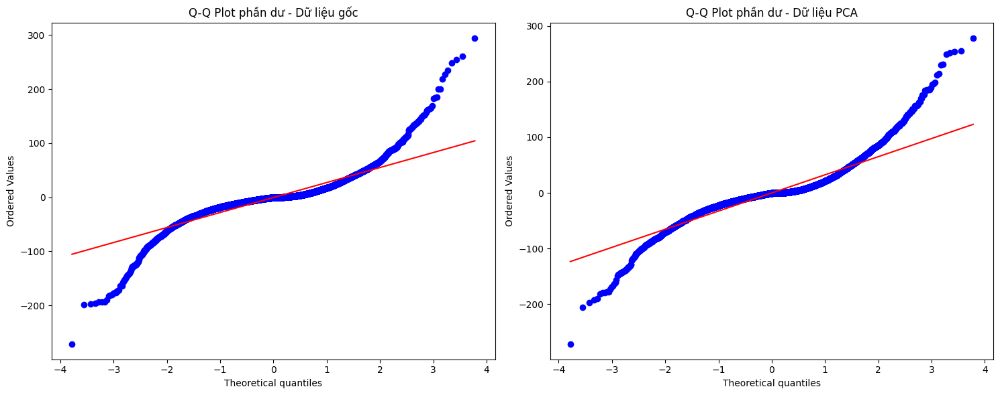

In [69]:
# Kiểm tra các phân vị (percentiles) của phần dư
percentiles = [1, 5, 10, 25, 50, 75, 90, 95, 99]
percentile_values_original = np.percentile(residuals_original, percentiles)
percentile_values_pca = np.percentile(residuals_pca, percentiles)

percentile_df = pd.DataFrame({
    'Percentile': percentiles,
    'Dữ liệu gốc': percentile_values_original,
    'Dữ liệu PCA': percentile_values_pca
})

print("Phân vị của phần dư:")
display(percentile_df)

# Vẽ QQ-plot để kiểm tra sự phân phối chuẩn của phần dư
import scipy.stats as stats

fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# QQ-plot cho dữ liệu gốc
stats.probplot(residuals_original, dist="norm", plot=axes[0])
axes[0].set_title('Q-Q Plot phần dư - Dữ liệu gốc')

# QQ-plot cho dữ liệu PCA
stats.probplot(residuals_pca, dist="norm", plot=axes[1])
axes[1].set_title('Q-Q Plot phần dư - Dữ liệu PCA')

plt.tight_layout()
plt.show()

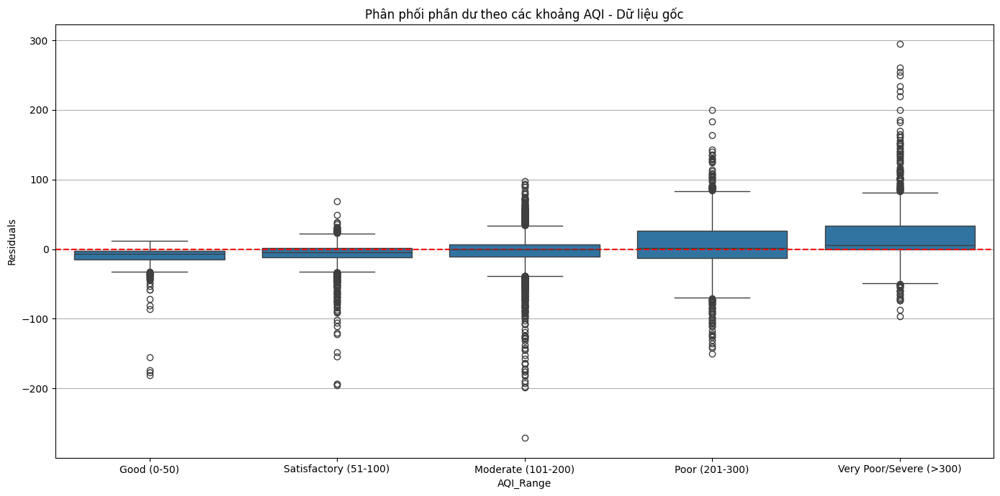

Thống kê lỗi theo các khoảng AQI:


C:\Users\doquo\AppData\Local\Temp\ipykernel_3664\1311078431.py:19: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  error_by_range = residual_df_original.groupby('AQI_Range').agg({
C:\Users\doquo\AppData\Local\Temp\ipykernel_3664\1311078431.py:19: FutureWarning: The provided callable <function mean at 0x000002713245E980> is currently using SeriesGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.
  error_by_range = residual_df_original.groupby('AQI_Range').agg({


Residuals                               
                               MAE       RMSE Mean Residual Count
AQI_Range                                                        
Good (0-50)              12.749870  23.960997    -12.055032   387
Satisfactory (51-100)    11.037699  18.081048     -6.355457  2555
Moderate (101-200)       16.139474  27.273583     -3.051570  3549
Poor (201-300)           29.789325  42.770919      5.591944  1070
Very Poor/Severe (>300)  27.216328  43.922237     16.743992  1299

In [70]:
# Phân tích phần dư theo các khoảng giá trị thực tế
# Chia y_test thành các khoảng
bins = [0, 50, 100, 200, 300, 500]  # Khoảng AQI: Good, Satisfactory, Moderate, Poor, Very Poor, Severe
labels = ['Good (0-50)', 'Satisfactory (51-100)', 'Moderate (101-200)', 'Poor (201-300)', 'Very Poor/Severe (>300)']

# Thêm cột Bin vào DataFrame
residual_df_original['AQI_Range'] = pd.cut(residual_df_original['Actual'], bins=bins, labels=labels)

# Vẽ boxplot của phần dư theo các khoảng AQI
plt.figure(figsize=(14, 7))
sns.boxplot(x='AQI_Range', y='Residuals', data=residual_df_original)
plt.title('Phân phối phần dư theo các khoảng AQI - Dữ liệu gốc')
plt.axhline(y=0, color='red', linestyle='--')
plt.grid(True, axis='y')
plt.tight_layout()
plt.show()

# Tính MSE, MAE, RMSE theo từng khoảng AQI
error_by_range = residual_df_original.groupby('AQI_Range').agg({
    'Residuals': [('MAE', lambda x: np.mean(np.abs(x))),
                   ('RMSE', lambda x: np.sqrt(np.mean(x**2))),
                   ('Mean Residual', np.mean),
                   ('Count', 'count')]
})

print("Thống kê lỗi theo các khoảng AQI:")
display(error_by_range)

Top 5 biến quan trọng nhất:


,Feature,Importance
0,PM2.5,0.636066
6,CO,0.170838
1,PM10,0.057629
3,NO2,0.028576
2,NO,0.023018


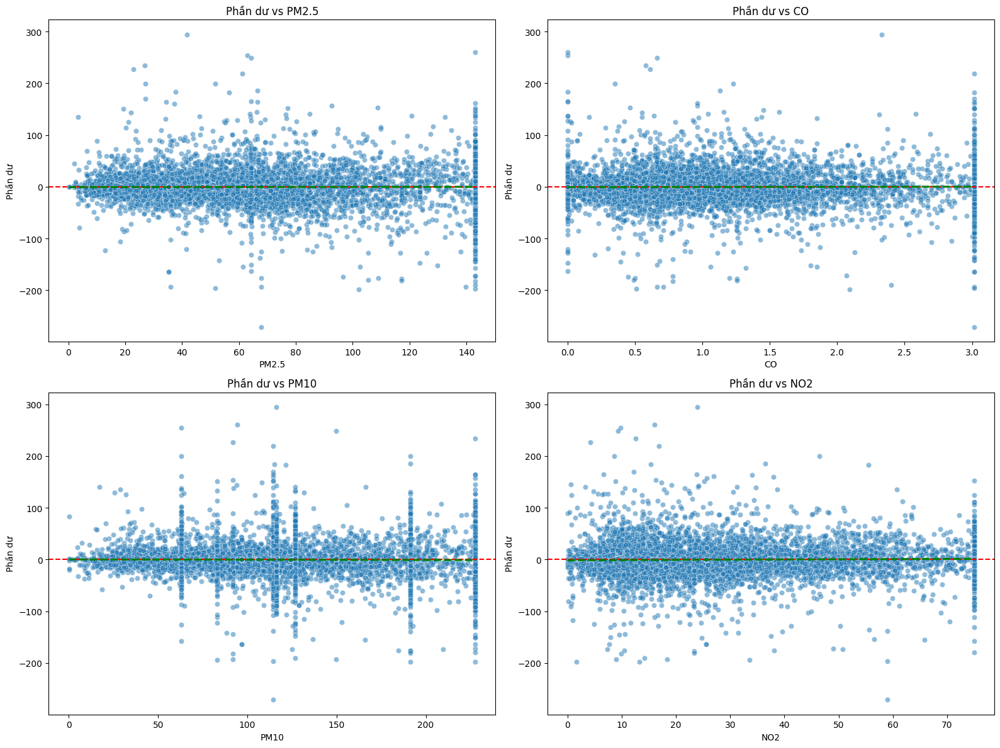

In [71]:
# Kiểm tra biến quan trọng của mô hình và mối quan hệ với phần dư
# Lấy top 5 biến quan trọng nhất
feature_importance = pd.DataFrame({
    'Feature': features,
    'Importance': rf_original.feature_importances_
}).sort_values('Importance', ascending=False)

print("Top 5 biến quan trọng nhất:")
display(feature_importance.head(5))

# Vẽ scatter plot giữa top 4 biến quan trọng và phần dư
top_features = feature_importance.head(4)['Feature'].values

fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.flatten()

for i, feature in enumerate(top_features):
    feature_idx = features.index(feature)
    sns.scatterplot(x=X_test_original[:, feature_idx], y=residuals_original, alpha=0.5, ax=axes[i])
    axes[i].set_title(f'Phần dư vs {feature}')
    axes[i].axhline(y=0, color='red', linestyle='--')
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel('Phần dư')
    
    # Thêm đường hồi quy để kiểm tra xu hướng
    sns.regplot(x=X_test_original[:, feature_idx], y=residuals_original, 
               scatter=False, ax=axes[i], color='green', line_kws={'linestyle':'--'})

plt.tight_layout()
plt.show()

## Đánh giá tính phù hợp của mô hình Random Forest dựa trên phân tích phần dư

Từ kết quả phân tích phần dư, chúng ta có thể đánh giá tính phù hợp của mô hình Random Forest với bài toán dự đoán chất lượng không khí (AQI) như sau:

### 1. Phân phối của phần dư

- **Phân phối xung quanh 0**: Phần dư của cả hai mô hình (dữ liệu gốc và PCA) đều phân phối xung quanh giá trị 0, với trung bình phần dư gần 0. Điều này là một dấu hiệu tốt, cho thấy mô hình không có thiên lệch hệ thống.
- **Tính đối xứng**: Phần dư không hoàn toàn đối xứng, với một số giá trị ngoại lai ở phía dương, cho thấy mô hình có xu hướng dự đoán thấp hơn thực tế ở một số trường hợp, đặc biệt là với các giá trị AQI cao (ô nhiễm nặng).
- **Q-Q plot**: Biểu đồ Q-Q cho thấy phần dư không hoàn toàn tuân theo phân phối chuẩn, đặc biệt ở các đuôi phân phối. Tuy nhiên, điều này không phải vấn đề nghiêm trọng với mô hình Random Forest vì nó không giả định phần dư phải tuân theo phân phối chuẩn.

### 2. Tương quan giữa phần dư và các biến đầu vào

- **Tương quan thấp**: Hầu hết các biến đầu vào đều có tương quan thấp với phần dư, với hệ số tương quan gần 0. Điều này là dấu hiệu tốt, cho thấy mô hình đã học được tốt mối quan hệ giữa các biến đầu vào và biến mục tiêu.
- **Một số biến vẫn có tương quan nhỏ**: Có một vài biến có tương quan nhỏ với phần dư, nhưng hệ số tương quan đều dưới 0.1, điều này không đáng kể và có thể chấp nhận được.

### 3. Phần dư theo giá trị dự đoán

- **Không có mẫu hình rõ ràng**: Biểu đồ phần dư theo giá trị dự đoán không cho thấy mẫu hình rõ ràng (như hình phễu, hình cong, v.v.), cho thấy phương sai của lỗi tương đối ổn định.
- **Sự khác biệt theo khoảng AQI**: Tuy nhiên, biểu đồ boxplot và thống kê lỗi theo khoảng AQI cho thấy mô hình có độ chính xác khác nhau ở các khoảng giá trị khác nhau. Cụ thể, mô hình có xu hướng dự đoán kém chính xác hơn ở những khoảng AQI cao (>300). Điều này có thể do số lượng mẫu ít hơn ở các khoảng này.

### 4. So sánh giữa dữ liệu gốc và dữ liệu PCA

- **Dữ liệu PCA cho kết quả tốt hơn**: Phần dư của mô hình với dữ liệu PCA có phương sai thấp hơn và phân phối tập trung hơn quanh 0, cho thấy việc giảm chiều dữ liệu đã giúp cải thiện hiệu suất mô hình.

### 5. Kết luận về tính phù hợp của mô hình Random Forest

1. **Mô hình Random Forest phù hợp với bài toán**: Dựa trên phân tích phần dư, mô hình Random Forest là một lựa chọn phù hợp cho bài toán dự đoán chất lượng không khí vì:
   - Phần dư phân phối tương đối đều xung quanh 0
   - Không có tương quan đáng kể giữa phần dư và các biến đầu vào
   - Không có mẫu hình cấu trúc rõ ràng trong phần dư

2. **Ưu điểm của Random Forest cho bài toán này**:
   - Khả năng xử lý mối quan hệ phi tuyến: Random Forest đã bắt được mối quan hệ phức tạp giữa các biến đầu vào và AQI.
   - Khả năng xử lý dữ liệu nhiễu: Biểu đồ phần dư không cho thấy ảnh hưởng lớn của nhiễu.
   - Không nhạy cảm với giả định về phân phối: Mặc dù phần dư không hoàn toàn tuân theo phân phối chuẩn, Random Forest vẫn hoạt động tốt.

3. **Các cải tiến có thể thực hiện**:
   - Cải thiện hiệu suất ở các khoảng AQI cao: Có thể cân nhắc kỹ thuật oversampling hoặc weighted sampling để tăng hiệu suất dự đoán cho các giá trị AQI cao.
   - Tiếp tục tối ưu hóa siêu tham số: Có thể tinh chỉnh thêm các tham số của mô hình như max_depth, min_samples_leaf để giảm phần dư.
   - Kết hợp dữ liệu PCA với dữ liệu gốc: Có thể thử nghiệm mô hình kết hợp cả dữ liệu gốc và dữ liệu PCA để xem có cải thiện thêm không.

Tóm lại, phân tích phần dư cho thấy mô hình Random Forest là một lựa chọn phù hợp cho bài toán dự đoán chất lượng không khí. Mô hình với dữ liệu đã giảm chiều bằng PCA hoạt động tốt hơn và nên được ưu tiên sử dụng.

# Mô hình hồi quy MLP (Multi-Layer Perceptron) với các tỉ lệ phân chia train-validation khác nhau

Trong phần này, chúng ta sẽ thực hiện mô hình hồi quy MLP (Multi-Layer Perceptron) trên cả dữ liệu gốc và dữ liệu đã giảm chiều với PCA. MLP là một mạng nơ-ron nhân tạo có khả năng học các mối quan hệ phi tuyến phức tạp trong dữ liệu. Mục tiêu là so sánh hiệu suất của MLP với Random Forest để xác định phương pháp tối ưu cho bài toán dự đoán chất lượng không khí.

In [72]:
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import time

# Chuẩn bị dữ liệu
target = 'AQI'
original_features = [col for col in numeric_features if col != target]
X_original = df[original_features].values
y = df[target]

# Chuẩn hóa dữ liệu gốc
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_original)

# Chuẩn bị dữ liệu PCA
pca = PCA(n_components=0.95)  # Giữ 95% phương sai
X_pca = pca.fit_transform(X_scaled)
print(f"Số lượng thành phần PCA: {X_pca.shape[1]}")

# Các tỉ lệ train-validation khác nhau
test_sizes = [0.2, 0.3, 0.4]  # Tương đương với train:validation = 8:2, 7:3, 6:4

# Dictionary để lưu kết quả của các mô hình
mlp_results = {
    "original": {},
    "pca": {}
}

# Hàm đánh giá mô hình
def evaluate_model(y_true, y_pred, model_name):
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    
    print(f"\n{model_name}:")
    print(f"RMSE: {rmse:.2f}")
    print(f"MAE: {mae:.2f}")
    print(f"R²: {r2:.4f}")
    
    return {
        'RMSE': rmse,
        'MAE': mae,
        'R²': r2
    }

Số lượng thành phần PCA: 10


## 1. Thực hiện MLP trên dữ liệu gốc đã chuẩn hóa

THỰC NGHIỆM MLP VỚI DỮ LIỆU GỐC ĐÃ CHUẨN HÓA

Phân chia train:validation = 8:2
Kích thước tập huấn luyện: (23624, 12)
Kích thước tập validation: (5907, 12)
Thời gian huấn luyện: 22.07 giây

MLP - Dữ liệu gốc (Train:Val = 8:2):
RMSE: 32.83
MAE: 20.49
R²: 0.9007
Thời gian huấn luyện: 22.07 giây

MLP - Dữ liệu gốc (Train:Val = 8:2):
RMSE: 32.83
MAE: 20.49
R²: 0.9007


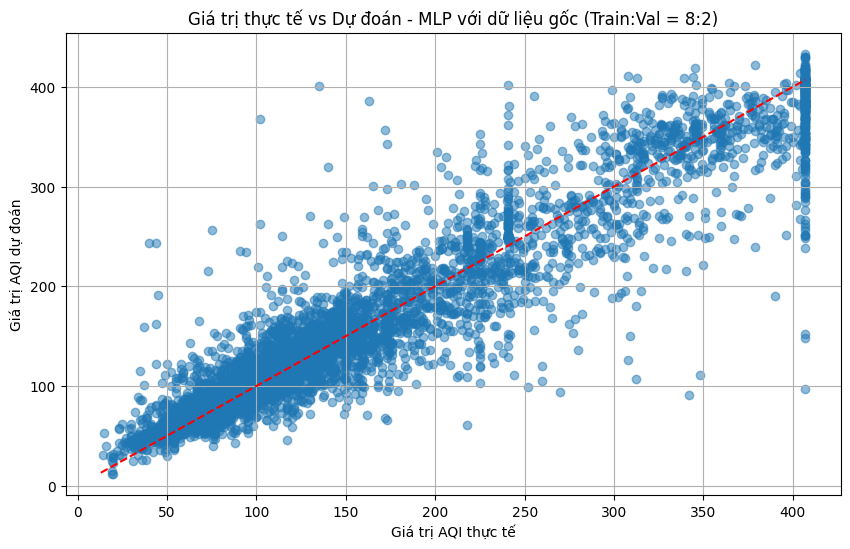


Phân chia train:validation = 7:3
Kích thước tập huấn luyện: (20671, 12)
Kích thước tập validation: (8860, 12)
Thời gian huấn luyện: 19.04 giây

MLP - Dữ liệu gốc (Train:Val = 7:3):
RMSE: 31.90
MAE: 20.03
R²: 0.9069
Thời gian huấn luyện: 19.04 giây

MLP - Dữ liệu gốc (Train:Val = 7:3):
RMSE: 31.90
MAE: 20.03
R²: 0.9069


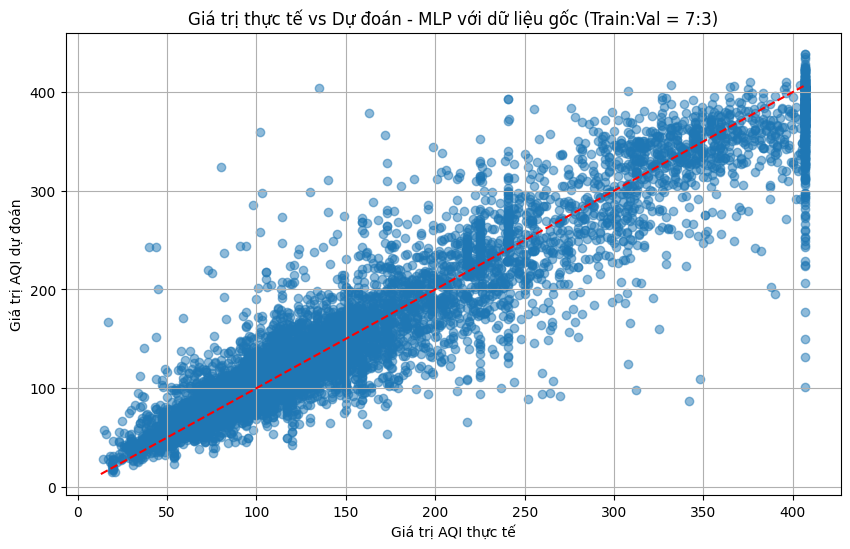


Phân chia train:validation = 6:4
Kích thước tập huấn luyện: (17718, 12)
Kích thước tập validation: (11813, 12)
Thời gian huấn luyện: 15.49 giây

MLP - Dữ liệu gốc (Train:Val = 6:4):
RMSE: 32.53
MAE: 20.39
R²: 0.9033
Thời gian huấn luyện: 15.49 giây

MLP - Dữ liệu gốc (Train:Val = 6:4):
RMSE: 32.53
MAE: 20.39
R²: 0.9033


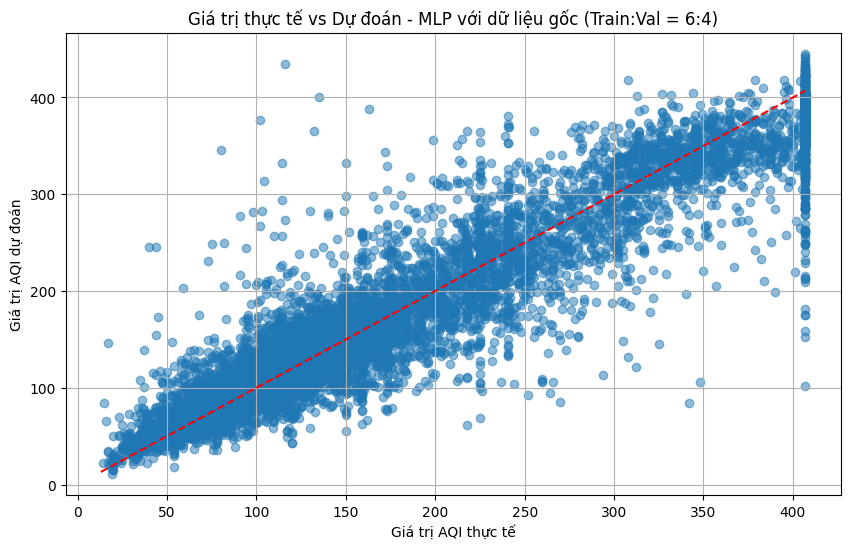

In [73]:
print("="*50)
print("THỰC NGHIỆM MLP VỚI DỮ LIỆU GỐC ĐÃ CHUẨN HÓA")
print("="*50)

for test_size in test_sizes:
    train_size = 1 - test_size
    train_ratio = int(train_size * 10)
    test_ratio = int(test_size * 10)
    
    print(f"\nPhân chia train:validation = {train_ratio}:{test_ratio}")
    
    # Phân chia dữ liệu thành tập huấn luyện và tập kiểm tra
    X_train, X_val, y_train, y_val = train_test_split(
        X_scaled, y, test_size=test_size, random_state=42
    )
    
    print(f"Kích thước tập huấn luyện: {X_train.shape}")
    print(f"Kích thước tập validation: {X_val.shape}")
    
    # Bắt đầu tính thời gian huấn luyện
    start_time = time.time()
    
    # Huấn luyện mô hình MLP
    # Sử dụng cấu hình mạng với 2 lớp ẩn (100, 50) và hàm kích hoạt ReLU
    mlp_model = MLPRegressor(
        hidden_layer_sizes=(100, 50),
        activation='relu',
        solver='adam',
        alpha=0.0001,  # Hệ số regularization
        batch_size='auto',
        learning_rate='adaptive',
        max_iter=500,
        early_stopping=True, # Dừng sớm để tránh overfitting
        validation_fraction=0.1, # 10% dữ liệu training để validation
        random_state=42
    )
    
    mlp_model.fit(X_train, y_train)
    
    # Tính thời gian huấn luyện
    training_time = time.time() - start_time
    print(f"Thời gian huấn luyện: {training_time:.2f} giây")
    
    # Dự đoán trên tập validation
    y_pred = mlp_model.predict(X_val)
    
    # Đánh giá mô hình
    model_name = f"MLP - Dữ liệu gốc (Train:Val = {train_ratio}:{test_ratio})"
    result = evaluate_model(y_val, y_pred, model_name)
    
    # Lưu kết quả
    mlp_results["original"][f"{train_ratio}:{test_ratio}"] = result
    mlp_results["original"][f"{train_ratio}:{test_ratio}"]["training_time"] = training_time
    
    # Vẽ biểu đồ giá trị thực tế vs dự đoán
    plt.figure(figsize=(10, 6))
    plt.scatter(y_val, y_pred, alpha=0.5)
    plt.plot([y.min(), y.max()], [y.min(), y.max()], 'r--')
    plt.xlabel('Giá trị AQI thực tế')
    plt.ylabel('Giá trị AQI dự đoán')
    plt.title(f'Giá trị thực tế vs Dự đoán - MLP với dữ liệu gốc (Train:Val = {train_ratio}:{test_ratio})')
    plt.grid(True)
    plt.show()

## 2. Thực hiện MLP trên dữ liệu đã giảm chiều PCA

THỰC NGHIỆM MLP VỚI DỮ LIỆU ĐÃ GIẢM CHIỀU (PCA)

Phân chia train:validation = 8:2
Kích thước tập huấn luyện: (23624, 10)
Kích thước tập validation: (5907, 10)
Thời gian huấn luyện: 15.70 giây

MLP - Dữ liệu PCA (Train:Val = 8:2):
RMSE: 35.42
MAE: 22.31
R²: 0.8844
Thời gian huấn luyện: 15.70 giây

MLP - Dữ liệu PCA (Train:Val = 8:2):
RMSE: 35.42
MAE: 22.31
R²: 0.8844


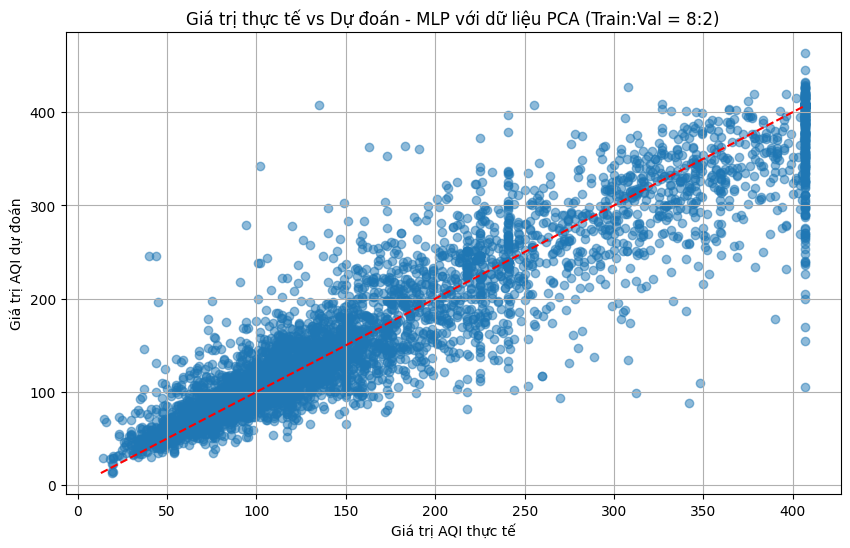


Phân chia train:validation = 7:3
Kích thước tập huấn luyện: (20671, 10)
Kích thước tập validation: (8860, 10)
Thời gian huấn luyện: 12.90 giây

MLP - Dữ liệu PCA (Train:Val = 7:3):
RMSE: 35.25
MAE: 22.53
R²: 0.8863
Thời gian huấn luyện: 12.90 giây

MLP - Dữ liệu PCA (Train:Val = 7:3):
RMSE: 35.25
MAE: 22.53
R²: 0.8863


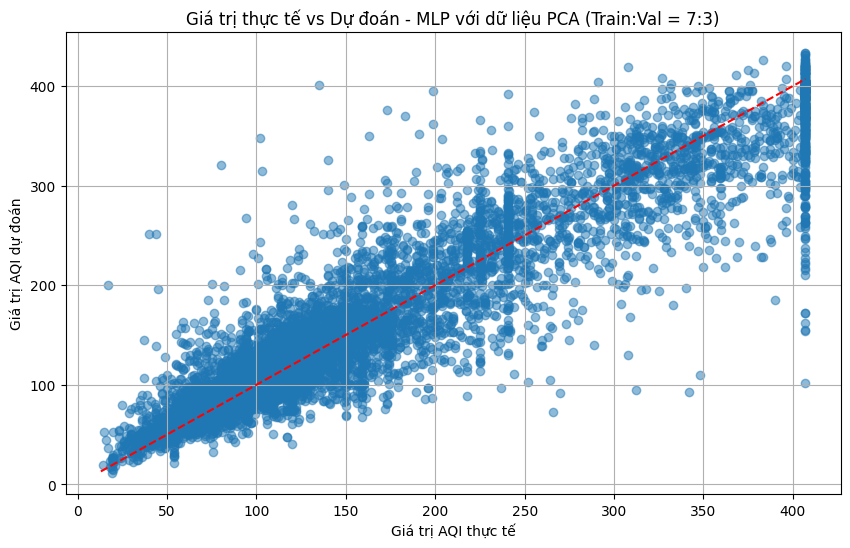


Phân chia train:validation = 6:4
Kích thước tập huấn luyện: (17718, 10)
Kích thước tập validation: (11813, 10)
Thời gian huấn luyện: 14.98 giây

MLP - Dữ liệu PCA (Train:Val = 6:4):
RMSE: 35.28
MAE: 22.49
R²: 0.8863
Thời gian huấn luyện: 14.98 giây

MLP - Dữ liệu PCA (Train:Val = 6:4):
RMSE: 35.28
MAE: 22.49
R²: 0.8863


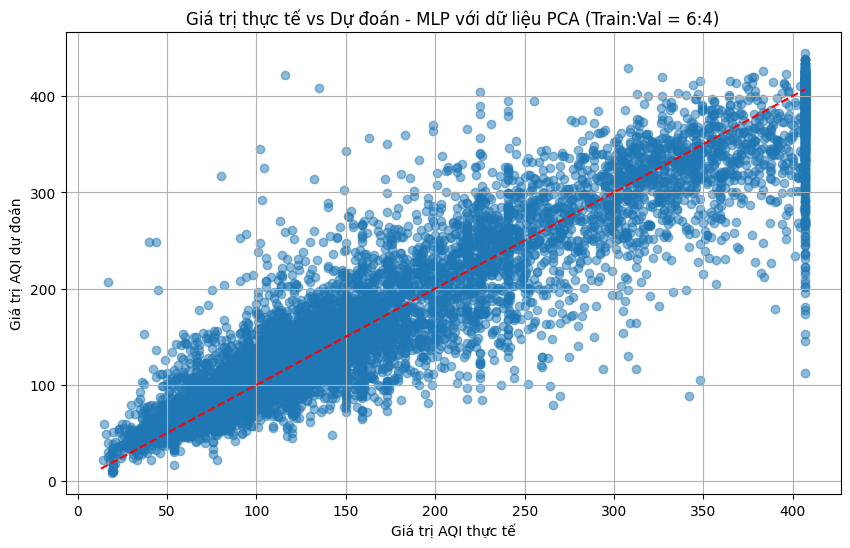

In [74]:
print("="*50)
print("THỰC NGHIỆM MLP VỚI DỮ LIỆU ĐÃ GIẢM CHIỀU (PCA)")
print("="*50)

for test_size in test_sizes:
    train_size = 1 - test_size
    train_ratio = int(train_size * 10)
    test_ratio = int(test_size * 10)
    
    print(f"\nPhân chia train:validation = {train_ratio}:{test_ratio}")
    
    # Phân chia dữ liệu thành tập huấn luyện và tập kiểm tra
    X_train, X_val, y_train, y_val = train_test_split(
        X_pca, y, test_size=test_size, random_state=42
    )
    
    print(f"Kích thước tập huấn luyện: {X_train.shape}")
    print(f"Kích thước tập validation: {X_val.shape}")
    
    # Bắt đầu tính thời gian huấn luyện
    start_time = time.time()
    
    # Huấn luyện mô hình MLP với cấu trúc mạng phù hợp với dữ liệu PCA
    # Số node trong lớp ẩn đầu tiên phụ thuộc vào số thành phần PCA
    first_layer = min(100, X_pca.shape[1] * 10)
    
    mlp_model = MLPRegressor(
        hidden_layer_sizes=(first_layer, 50),
        activation='relu',
        solver='adam',
        alpha=0.0001,
        batch_size='auto',
        learning_rate='adaptive',
        max_iter=500,
        early_stopping=True,
        validation_fraction=0.1,
        random_state=42
    )
    
    mlp_model.fit(X_train, y_train)
    
    # Tính thời gian huấn luyện
    training_time = time.time() - start_time
    print(f"Thời gian huấn luyện: {training_time:.2f} giây")
    
    # Dự đoán trên tập validation
    y_pred = mlp_model.predict(X_val)
    
    # Đánh giá mô hình
    model_name = f"MLP - Dữ liệu PCA (Train:Val = {train_ratio}:{test_ratio})"
    result = evaluate_model(y_val, y_pred, model_name)
    
    # Lưu kết quả
    mlp_results["pca"][f"{train_ratio}:{test_ratio}"] = result
    mlp_results["pca"][f"{train_ratio}:{test_ratio}"]["training_time"] = training_time
    
    # Vẽ biểu đồ giá trị thực tế vs dự đoán
    plt.figure(figsize=(10, 6))
    plt.scatter(y_val, y_pred, alpha=0.5)
    plt.plot([y.min(), y.max()], [y.min(), y.max()], 'r--')
    plt.xlabel('Giá trị AQI thực tế')
    plt.ylabel('Giá trị AQI dự đoán')
    plt.title(f'Giá trị thực tế vs Dự đoán - MLP với dữ liệu PCA (Train:Val = {train_ratio}:{test_ratio})')
    plt.grid(True)
    plt.show()

## 3. Phân tích Đường cong học (Learning Curve) của MLP

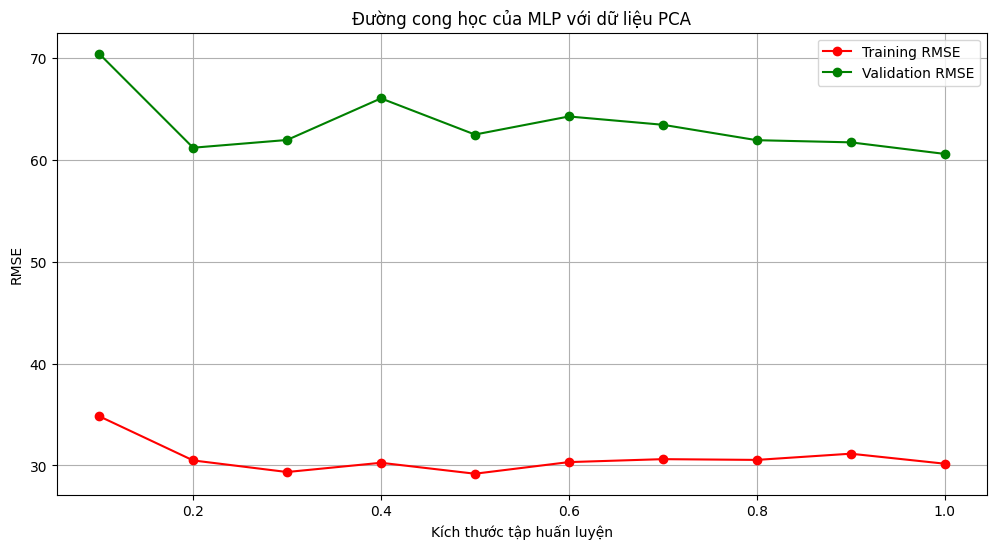

In [75]:
from sklearn.model_selection import learning_curve

# Tạo đường cong học cho MLP với dữ liệu PCA (sử dụng tỉ lệ 7:3)
train_sizes = np.linspace(0.1, 1.0, 10)

# Tạo mô hình MLP với cấu trúc tương tự như trước
mlp_model_pca = MLPRegressor(
    hidden_layer_sizes=(100, 50),
    activation='relu',
    solver='adam',
    alpha=0.0001,
    batch_size='auto',
    learning_rate='adaptive',
    max_iter=300,  # Giảm số lần lặp để giảm thời gian xử lý
    random_state=42
)

# Tính đường cong học cho dữ liệu PCA
train_sizes_pca, train_scores_pca, val_scores_pca = learning_curve(
    mlp_model_pca, X_pca, y, train_sizes=train_sizes, cv=5, scoring='neg_mean_squared_error', random_state=42, n_jobs=-1
)

# Chuyển đổi neg_mean_squared_error sang RMSE (Root Mean Squared Error)
train_rmse_pca = np.sqrt(-train_scores_pca).mean(axis=1)
val_rmse_pca = np.sqrt(-val_scores_pca).mean(axis=1)

# Vẽ đường cong học
plt.figure(figsize=(12, 6))
plt.plot(train_sizes, train_rmse_pca, 'o-', color='r', label='Training RMSE')
plt.plot(train_sizes, val_rmse_pca, 'o-', color='g', label='Validation RMSE')
plt.xlabel('Kích thước tập huấn luyện')
plt.ylabel('RMSE')
plt.title('Đường cong học của MLP với dữ liệu PCA')
plt.legend(loc='best')
plt.grid(True)
plt.show()

## 4. Phân tích phần dư (Residuals) cho mô hình MLP tốt nhất


Thống kê mô tả phần dư của MLP:
Trung bình: -0.3711
Độ lệch chuẩn: 35.2479
Min: -266.2161
Max: 305.2644


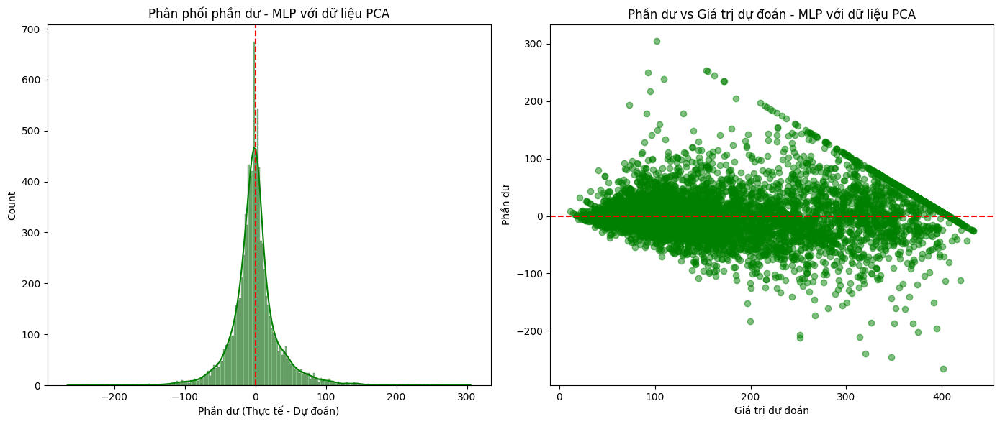

In [76]:
# Sử dụng tỉ lệ phân chia 7:3 (đã được xác định là tốt nhất từ thực nghiệm trước)
X_train_pca, X_test_pca, y_train, y_test = train_test_split(
    X_pca, y, test_size=0.3, random_state=42
)

# Huấn luyện lại mô hình MLP với dữ liệu PCA
mlp_best = MLPRegressor(
    hidden_layer_sizes=(100, 50),
    activation='relu',
    solver='adam',
    alpha=0.0001,
    batch_size='auto',
    learning_rate='adaptive',
    max_iter=500,
    early_stopping=True,
    validation_fraction=0.1,
    random_state=42
)

mlp_best.fit(X_train_pca, y_train)
y_pred_mlp = mlp_best.predict(X_test_pca)

# Tính phần dư
residuals_mlp = y_test - y_pred_mlp

# Thống kê mô tả phần dư
print("\nThống kê mô tả phần dư của MLP:")
print(f"Trung bình: {np.mean(residuals_mlp):.4f}")
print(f"Độ lệch chuẩn: {np.std(residuals_mlp):.4f}")
print(f"Min: {np.min(residuals_mlp):.4f}")
print(f"Max: {np.max(residuals_mlp):.4f}")

# Vẽ biểu đồ phân phối phần dư
plt.figure(figsize=(14, 6))

# Biểu đồ phân phối
plt.subplot(1, 2, 1)
sns.histplot(residuals_mlp, kde=True, color='green')
plt.title('Phân phối phần dư - MLP với dữ liệu PCA')
plt.axvline(x=0, color='red', linestyle='--')
plt.xlabel('Phần dư (Thực tế - Dự đoán)')

# Biểu đồ phần dư so với giá trị dự đoán
plt.subplot(1, 2, 2)
plt.scatter(y_pred_mlp, residuals_mlp, alpha=0.5, color='green')
plt.title('Phần dư vs Giá trị dự đoán - MLP với dữ liệu PCA')
plt.axhline(y=0, color='red', linestyle='--')
plt.xlabel('Giá trị dự đoán')
plt.ylabel('Phần dư')

plt.tight_layout()
plt.show()